In [ ]:
# prompt: I want to pip install pandas as pd

!pip install pandas
!pip install mtcnn
import pandas as pd
import os
from PIL import Image
from IPython.display import display
import csv
import random
from collections import Counter
import matplotlib.pyplot as plt
from mtcnn import MTCNN
import numpy as np
import math
import ast


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.0 MB/s eta 0:00:00


In [ ]:
# prompt: I want to load this file: /content/drive/MyDrive/Child Generator/processed_tensors.pt
directory_path = "/content/drive/MyDrive/Child Generator/Families"
os.listdir(directory_path)


['Yao',
 'Wang',
 'Tsuguko',
 'Wilson',
 'Williams',
 'Victoria',
 'Tyler',
 'Woods',
 'Wayne',
 'Walton',
 'Truman',
 'Taylor',
 'Sinatra',
 'Spelling',
 'Sheen',
 'Taft',
 'Smith',
 'Saudi',
 'Stiller',
 'Shaw',
 'Sen',
 'Saud',
 'Rama',
 'Rockefeller',
 'Sahni',
 'Samarth',
 'Ritter',
 'Roosevelt',
 'Rossellini',
 'Reagan',
 'Richie',
 'Presley',
 'Power',
 'Osbourne',
 'Paltrow',
 'Luft',
 'Noah',
 'Maktoum',
 'Morgan',
 'Nixon',
 'Obama',
 'Manning',
 'Liechtenstein',
 'Lewis',
 'Khan',
 'KhannaVinod',
 'Kennedy',
 'Lenon',
 'LeePolitician',
 'Lamas',
 'LeeActor',
 'Kapoor',
 'Khanna',
 'Judd',
 'Jolie',
 'Hepburn',
 'Hale',
 'Hilton',
 'Hanks',
 'Iman',
 'Hoover',
 'Howard',
 'Jiang',
 'Johnson',
 'Guthrie',
 'Griffith',
 'Dutt',
 'Eisenhower',
 'Greek',
 'Fonda',
 'Fairbanks',
 'FordPresident',
 'FordMotor',
 'Fisher',
 'Griffey',
 'Douglas',
 'Cyrus',
 'Cole',
 'Clinton',
 'Deol',
 'Casiraghi',
 'Crosby',
 'Coolidge',
 'Clooney',
 'Chen',
 'Cash',
 'Carter',
 'Carradine',
 'Bea

Image loaded successfully.


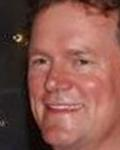

In [ ]:



def import_image(image_path):
  """Imports an image from the specified path using Pillow library.

  Args:
    image_path: The path to the image file.

  Returns:
    A PIL Image object if successful, otherwise None.
  """
  base_path = "/content/drive/MyDrive/Child Generator/"
  image_path = os.path.join(base_path, image_path)
  try:
    img = Image.open(image_path)
    return img
  except FileNotFoundError:
    print(f"Error: Image file not found at {image_path}")
    ## check if it's got to do with backslashes vs forward slashes
    linux_path = image_path.replace('\\', '/')
    print(f"Trying again with Linux path: {linux_path}")
    try:
      img = Image.open(linux_path)
      return img
    except FileNotFoundError:
      print(f"Error: Image file not found at {linux_path}")
    return None
  except Exception as e:
    print(f"Error loading image: {e}")
    return None

# Example usage:
image_path = "/content/drive/MyDrive/Child Generator/Families/Hilton/Richard_Howard_Hilton/Richard_Howard_Hilton_0009.jpg"
img = import_image(image_path)

if img:
  print("Image loaded successfully.")
  # You can now perform operations on the image object (e.g., display, resize)
  display(img) # uncomment to show the image



In [ ]:
helper_files_dir = "/content/drive/MyDrive/Child Generator/HelperFiles"
family_images_txt_file = os.path.join(helper_files_dir, "family_images_data.txt")
trios_txt_file = os.path.join(helper_files_dir, "processed_trios-SAVED.txt")

with open(family_images_txt_file, "r") as f:
  family_images_data = f.read()

len(family_images_data)


1356667

In [ ]:
def parse_image_data(filename):
    """Parse the family_images_data.txt file to create person->images mapping"""
    person_to_images = {}
    current_person = None

    with open(filename, 'r') as f:
        for line in f:
            # Remove line numbers and strip whitespace
            if '|' in line:
                line = line.split('|')[1].strip()
            else:
                line = line.strip()

            if not line:
                continue

            # Check for person name (ends with colon)
            if line.endswith(':'):
                current_person = line[:-1].strip()  # Remove the colon
                continue

            # Check if line contains a path (should contain 'Families')
            if 'Families' in line:
                # Convert Windows path to Linux path
                path = line.replace('\\', '/')
                if current_person:
                    if current_person not in person_to_images:
                        person_to_images[current_person] = []
                    person_to_images[current_person].append(path)

    return person_to_images

In [ ]:
def parse_trios(filename):
    """Parse the processed_trios-SAVED.txt file to get family relationships"""
    trios = []
    current_family = None
    current_trio = {}

    with open(filename, 'r') as f:
        for line in f:
            line = line.strip()
            if not line:
                continue

            if line.startswith('Family:'):
                # If we have a complete trio
                if current_trio and len(current_trio) == 4:
                    trios.append(current_trio)
                current_family = line.split(': ')[1]
                current_trio = {'Family': current_family}
            elif line.startswith(('Father:', 'Mother:', 'Child:')):
                role, name = line.split(': ')
                current_trio[role] = name

        # Add the last trio if it's complete
        if current_trio and len(current_trio) == 4:
            trios.append(current_trio)

    return trios

In [ ]:
def combine_data(image_data, trios):
    """Combine the image data with the trios data"""
    combined_trios = []

    for trio in trios:
        combined_trio = {
            'Family': trio['Family'],
            'Father': {
                'name': trio['Father'],
                'images': image_data.get(trio['Father'], [])
            },
            'Mother': {
                'name': trio['Mother'],
                'images': image_data.get(trio['Mother'], [])
            },
            'Child': {
                'name': trio['Child'],
                'images': image_data.get(trio['Child'], [])
            }
        }
        combined_trios.append(combined_trio)

    return combined_trios

In [ ]:
image_data = parse_image_data(family_images_txt_file)
trios = parse_trios(trios_txt_file)
combined_trios = combine_data(image_data, trios)

In [ ]:
print(f"Number of people with images: {len(image_data)}")
print(f"Number of trios: {len(trios)}")
print(f"Number of combined trios: {len(combined_trios)}")

Number of people with images: 596
Number of trios: 353
Number of combined trios: 353


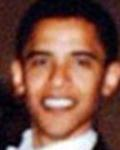

In [ ]:
combined_trios[0]['Father']['images'][0]

show = import_image(combined_trios[0]['Father']['images'][0])
display(show)

In [ ]:
combined_trios[-1]

{'Family': 'Maktoum',
 'Father': {'name': 'Rashid_bin_Saeed_Al_Maktoum',
  'images': ['Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/00e33dd2-f257-4293-bdb4-37a656e72a00.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/20709550-7ec3-4ffa-a94a-2b33f192e613.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/3379835a-77d0-4966-b23e-f044493818fc.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/3f64d954-4ec4-44d8-9413-9c53818087b5.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/93e10591-da58-4acb-94b6-bfbc7247b5a8.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/a440f509-dd76-4812-8d9d-889fa77aa0ad.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/ea13802b-6567-473c-a00b-703bf528f555.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/00e33dd2-f257-4293-bdb4-37a656e72a00.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/20709550-7ec3-4ffa-a94a-2b33f192e613.jpg',
   'Families/Maktoum/Rashid_bin_Saeed_Al_Maktoum/3379835a-77d0-4966-b23e-f044493818fc.jpg

In [ ]:


def export_to_csv(combined_trios, filename="combined_trios2.csv"):
    """Exports the combined trios data to a CSV file."""
    with open(filename, 'w', newline='') as csvfile:
        fieldnames = ['family_id', 'father_name', 'father_images', 'mother_name', 'mother_images', 'child_name', 'child_images']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

        writer.writeheader()
        for i, trio in enumerate(combined_trios):
            writer.writerow({
                'family_id': i + 1,
                'father_name': trio['Father']['name'],
                'father_images': ';'.join(trio['Father']['images']),
                'mother_name': trio['Mother']['name'],
                'mother_images': ';'.join(trio['Mother']['images']),
                'child_name': trio['Child']['name'],
                'child_images': ';'.join(trio['Child']['images'])
            })

export_to_csv(combined_trios)


In [ ]:
df = pd.read_csv('combined_trios.csv')
df.head()


,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...


In [ ]:
# prompt: I want to check the df and count how many have either the father_name, mother_name or child_name equal to "Unknown"

unknown_count = df[(df['father_name'] == 'Unknown') | (df['mother_name'] == 'Unknown') | (df['child_name'] == 'Unknown')]
print(unknown_count['father_name'])


13                                    Unknown
29                     Samuel_Ealy_Johnson_Jr
50                        Dwight_D_Eisenhower
51                        Dwight_D_Eisenhower
52                        Dwight_D_Eisenhower
61                            James_Roosevelt
77                                 J_P_Morgan
78                                 J_P_Morgan
103                              Beau_Bridges
106                               Peter_Fonda
124                            John_Carradine
125                            John_Carradine
129                           Keith_Carradine
130                           Keith_Carradine
131                          Robert_Carradine
138                                   Bo_Yibo
139                             Lee_Hoi_Chuen
140                             Lee_Hoi_Chuen
143                                   Unknown
168                                   Unknown
173                              Balraj_Sahni
174                              B

In [ ]:
unknown_family_ids = unknown_count['family_id'].tolist()

mask = ~df['family_id'].isin(unknown_family_ids)
df = df[mask]

In [ ]:
unknown_count = df[(df['father_name'] == 'Unknown') | (df['mother_name'] == 'Unknown') | (df['child_name'] == 'Unknown')].shape[0]
print(f"Number of rows with 'Unknown' in any column: {unknown_count}")


Number of rows with 'Unknown' in any column: 0


In [ ]:
df.head()

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...


In [ ]:
# prompt: I want to caculate what the mean and median and min and max number of images per person is, so father_images, mother_images and child_images

# Assuming your dataframe is named 'df' and has columns 'father_images', 'mother_images', and 'child_images'
# where the number of images is represented by the number of items in a semicolon-separated string

# Function to count images
def count_images(image_str):
    if isinstance(image_str, str) :
        return len(image_str.split(';'))
    return 0  # Handle cases where the string might be missing


# Apply the function to count images for each person
df['father_image_count'] = df['father_images'].apply(count_images)
df['mother_image_count'] = df['mother_images'].apply(count_images)
df['child_image_count'] = df['child_images'].apply(count_images)

# Calculate statistics
print("Father Image Statistics:")
print("Mean:", df['father_image_count'].mean())
print("Median:", df['father_image_count'].median())
print("Min:", df['father_image_count'].min())
print("Max:", df['father_image_count'].max())
print("\nMother Image Statistics:")
print("Mean:", df['mother_image_count'].mean())
print("Median:", df['mother_image_count'].median())
print("Min:", df['mother_image_count'].min())
print("Max:", df['mother_image_count'].max())
print("\nChild Image Statistics:")
print("Mean:", df['child_image_count'].mean())
print("Median:", df['child_image_count'].median())
print("Min:", df['child_image_count'].min())
print("Max:", df['child_image_count'].max())


Father Image Statistics:
Mean: 90.89115646258503
Median: 43.0
Min: 0
Max: 1491

Mother Image Statistics:
Mean: 33.2891156462585
Median: 19.5
Min: 0
Max: 182

Child Image Statistics:
Mean: 43.48299319727891
Median: 12.0
Min: 0
Max: 1609


In [ ]:
# prompt: find the count of families where father_images, mother_images or child_images is 0

# Count families where father_images, mother_images, or child_images is 0
zero_image_count = df[(df['father_image_count'] == 0) | (df['mother_image_count'] == 0) | (df['child_image_count'] == 0)]
print(f"Number of families with zero images for father, mother, or child: {zero_image_count.shape[0]}")


Number of families with zero images for father, mother, or child: 26


In [ ]:
zero_image_count.head()

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images,father_image_count,mother_image_count,child_image_count
5,6,George_H_W_Bush,NaN,Barbara_Pierce,Families/Bush/Barbara_Pierce/Barbara_Pierce_00...,George_W_Bush,Families/Bush/George_W_Bush/George_W_Bush_0001...,0,27,1491
6,7,George_H_W_Bush,NaN,Barbara_Pierce,Families/Bush/Barbara_Pierce/Barbara_Pierce_00...,Jeb_Bush,Families/Bush/Jeb_Bush/Jeb_Bush_0001.jpg;Famil...,0,27,68
7,8,George_H_W_Bush,NaN,Barbara_Pierce,Families/Bush/Barbara_Pierce/Barbara_Pierce_00...,Dorothy_Walker_Bush,Families/Bush/Dorothy_Walker_Bush/Dorothy_Walk...,0,27,5
8,9,George_W_Bush,Families/Bush/George_W_Bush/George_W_Bush_0001...,Laura_Bush,NaN,Barbara_Pierce_Bush,NaN,1491,0,0
9,10,George_W_Bush,Families/Bush/George_W_Bush/George_W_Bush_0001...,Laura_Bush,NaN,Jenna_Welch_Hager,NaN,1491,0,0


In [ ]:
df = df.dropna(subset=['father_images', 'mother_images', 'child_images'])
df.head()

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images,father_image_count,mother_image_count,child_image_count
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...,1212,56,25
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...,1212,56,21
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,4,63,1212
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...,2,63,23
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,7,3,63


In [ ]:
def count_images(image_str):
    if isinstance(image_str, str) :
        return len(image_str.split(';'))
    return 0  # Handle cases where the string might be missing


# Apply the function to count images for each person
df['father_image_count'] = df['father_images'].apply(count_images)
df['mother_image_count'] = df['mother_images'].apply(count_images)
df['child_image_count'] = df['child_images'].apply(count_images)

# Calculate statistics
print("Father Image Statistics:")
print("Mean:", df['father_image_count'].mean())
print("Median:", df['father_image_count'].median())
print("Min:", df['father_image_count'].min())
print("Max:", df['father_image_count'].max())
print("\nMother Image Statistics:")
print("Mean:", df['mother_image_count'].mean())
print("Median:", df['mother_image_count'].median())
print("Min:", df['mother_image_count'].min())
print("Max:", df['mother_image_count'].max())
print("\nChild Image Statistics:")
print("Mean:", df['child_image_count'].mean())
print("Median:", df['child_image_count'].median())
print("Min:", df['child_image_count'].min())
print("Max:", df['child_image_count'].max())

Father Image Statistics:
Mean: 86.68656716417911
Median: 48.0
Min: 1
Max: 1212

Mother Image Statistics:
Mean: 35.41044776119403
Median: 21.0
Min: 1
Max: 182

Child Image Statistics:
Mean: 40.559701492537314
Median: 13.0
Min: 1
Max: 1609


In [ ]:
# prompt: using df can expand on these statistics:
# Father Image Statistics:
# Mean: 86.68656716417911
# Median: 48.0
# Min: 1
# Max: 1212
# Mother Image Statistics:
# Mean: 35.41044776119403
# Median: 21.0
# Min: 1
# Max: 182
# Child Image Statistics:
# Mean: 40.559701492537314
# Median: 13.0
# Min: 1
# Max: 1609
# I want to know how many are father, child and mother are between 0-2 images, 3-10 images, 11-50 images and 50+ images

# Define the image count ranges
bins = [(0, 2), (3, 10), (11, 50), (51, float('inf'))]

# Function to categorize image counts
def categorize_image_count(count):
    for start, end in bins:
        if start <= count <= end:
            return f"{start}-{end}"
    return "Invalid"

# Apply categorization to the dataframe
df['father_image_category'] = df['father_image_count'].apply(categorize_image_count)
df['mother_image_category'] = df['mother_image_count'].apply(categorize_image_count)
df['child_image_category'] = df['child_image_count'].apply(categorize_image_count)

# Count occurrences of each category
for column in ['father_image_category', 'mother_image_category', 'child_image_category']:
    print(f"\n{column.replace('_image_category', '').title()} Image Counts:")
    counts = df[column].value_counts()
    for category, count in counts.items():
        print(f"{category}: {count}")



Father Image Counts:
51-inf: 123
11-50: 106
3-10: 30
0-2: 9

Mother Image Counts:
11-50: 114
51-inf: 74
3-10: 65
0-2: 15

Child Image Counts:
11-50: 127
3-10: 80
0-2: 32
51-inf: 29


to start with I'll return two images off each person.



In [ ]:
# prompt: I want to create a function that would take the loaded dataframe df
# and be able to do something like this.
# get_family(0) would return a dictionary of
# father_images:
# mother_images:
# child_images:
# Along with:
# Father_name:
# Mother_name:
# Child_name
# Note that I only want two randomly chosen image paths



def get_family(family_id, no_of_images=1):
  """
  Retrieves family information for a given family ID.

  Args:
    family_id: The ID of the family.

  Returns:
    A dictionary containing family information, or None if the family ID is not found.
  """
  try:
    family_data = df[df['family_id'] == family_id].iloc[0]

    father_images = random.sample(family_data['father_images'].split(';'), min(no_of_images, len(family_data['father_images'].split(';'))))
    mother_images = random.sample(family_data['mother_images'].split(';'), min(no_of_images, len(family_data['mother_images'].split(';'))))
    child_images = random.sample(family_data['child_images'].split(';'), min(no_of_images, len(family_data['child_images'].split(';'))))

    family_info = {
        'father_images': father_images,
        'mother_images': mother_images,
        'child_images': child_images,
        'Father_name': family_data['father_name'],
        'Mother_name': family_data['mother_name'],
        'Child_name': family_data['child_name']
    }
    return family_info
  except IndexError:
    print(f"Family with ID {family_id} not found.")
    return None


In [ ]:
len(df)

268

In [ ]:
df.head()

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images,father_image_count,mother_image_count,child_image_count,father_image_category,mother_image_category,child_image_category
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...,1212,56,25,51-inf,51-inf,11-50
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...,1212,56,21,51-inf,51-inf,11-50
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,4,63,1212,3-10,51-inf,51-inf
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...,2,63,23,0-2,51-inf,11-50
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,7,3,63,3-10,3-10,51-inf


In [ ]:
for i in range (1,10):
  print(get_family(i))

{'father_images': ['Families/Obama/Barack_Obama/Barack_Obama_20202.jpg', 'Families/Obama/Barack_Obama/Barack_Obama_20347.jpg'], 'mother_images': ['Families/Obama/Michelle_Obama/Michelle_Obama_00015.jpg', 'Families/Obama/Michelle_Obama/Michelle_Obama_00021.jpg'], 'child_images': ['Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama_00004.jpg', 'Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama_00006.jpg'], 'Father_name': 'Barack_Obama', 'Mother_name': 'Michelle_Obama', 'Child_name': 'Malia_Ann_Obama'}
{'father_images': ['Families/Obama/Barack_Obama/Barack_Obama_20397.jpg', 'Families/Obama/Barack_Obama/Barack_Obama_20255.jpg'], 'mother_images': ['Families/Obama/Michelle_Obama/Michelle_Obama_00019.jpg', 'Families/Obama/Michelle_Obama/Michelle_Obama_00018.jpg'], 'child_images': ['Families/Obama/Natasha_Obama/Natasha_Obama_00020.jpg', 'Families/Obama/Natasha_Obama/Natasha_Obama_00001.jpg'], 'Father_name': 'Barack_Obama', 'Mother_name': 'Michelle_Obama', 'Child_name': 'Natasha_Obama'}
{'father_image

In [ ]:
# prompt: I want to do head for the first 10 entries of the dataframe

df.head(10)


,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images,father_image_count,mother_image_count,child_image_count,father_image_category,mother_image_category,child_image_category
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...,1212,56,25,51-inf,51-inf,11-50
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...,1212,56,21,51-inf,51-inf,11-50
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,4,63,1212,3-10,51-inf,51-inf
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...,2,63,23,0-2,51-inf,11-50
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,7,3,63,3-10,3-10,51-inf
10,11,Jeb_Bush,Families/Bush/Jeb_Bush/Jeb_Bush_0001.jpg;Famil...,Columba_Bush,Families/Bush/Columba_Bush/Columba_Bush_0001.j...,George_Prescott_Bush,Families/Bush/George_Prescott_Bush/George_Pres...,68,8,23,51-inf,3-10,11-50
11,12,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...,Hillary_Clinton,Families/Clinton/Hillary_Clinton/Hillary_Clint...,Chelsea_Clinton,Families/Clinton/Chelsea_Clinton/Chelsea_Clint...,56,14,1,51-inf,11-50,0-2
12,13,William_Jefferson_Blythe,Families/Clinton/William_Jefferson_Blythe/Will...,Virginia_Clinton_Kelley,Families/Clinton/Virginia_Clinton_Kelley/Virgi...,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...,1,8,56,0-2,3-10,51-inf
14,15,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Jane_Wyman,Families/Reagan/Jane_Wyman/Jane_Wyman_0001.jpg...,Maureen_Reagan,Families/Reagan/Maureen_Reagan/Maureen_Reagan_...,69,21,9,51-inf,11-50,3-10
15,16,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Nancy_Reagan,Families/Reagan/Nancy_Reagan/Nancy_Reagan_0001...,Patti_Davis,Families/Reagan/Patti_Davis/Patti_Davis_0001.j...,69,40,14,51-inf,11-50,11-50


In [ ]:
# prompt: Using dataframe df: I want to export df to a csv called checkpoint2.csv, BUT BEFORE THAT i WANT TO DROP THESE COLUMNS father_image_count	mother_image_count	child_image_count	father_image_category	mother_image_category	child_image_category

# Drop specified columns from the dataframe
df = df.drop(columns=['father_image_count', 'mother_image_count', 'child_image_count', 'father_image_category', 'mother_image_category', 'child_image_category'])

# Export the modified dataframe to a CSV file
df.to_csv('checkpoint2.csv', index=False)


In [ ]:
df.head(10)

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images
0,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...
1,2,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...
2,3,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...
3,4,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...
4,5,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...
10,11,Jeb_Bush,Families/Bush/Jeb_Bush/Jeb_Bush_0001.jpg;Famil...,Columba_Bush,Families/Bush/Columba_Bush/Columba_Bush_0001.j...,George_Prescott_Bush,Families/Bush/George_Prescott_Bush/George_Pres...
11,12,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...,Hillary_Clinton,Families/Clinton/Hillary_Clinton/Hillary_Clint...,Chelsea_Clinton,Families/Clinton/Chelsea_Clinton/Chelsea_Clint...
12,13,William_Jefferson_Blythe,Families/Clinton/William_Jefferson_Blythe/Will...,Virginia_Clinton_Kelley,Families/Clinton/Virginia_Clinton_Kelley/Virgi...,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...
14,15,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Jane_Wyman,Families/Reagan/Jane_Wyman/Jane_Wyman_0001.jpg...,Maureen_Reagan,Families/Reagan/Maureen_Reagan/Maureen_Reagan_...
15,16,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Nancy_Reagan,Families/Reagan/Nancy_Reagan/Nancy_Reagan_0001...,Patti_Davis,Families/Reagan/Patti_Davis/Patti_Davis_0001.j...


In [ ]:
df = df.reset_index(drop=True)
df['family_id'] = df.index


In [ ]:
df.head(10)

,family_id,father_name,father_images,mother_name,mother_images,child_name,child_images
0,0,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Malia_Ann_Obama,Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama...
1,1,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,Michelle_Obama,Families/Obama/Michelle_Obama/Michelle_Obama_0...,Natasha_Obama,Families/Obama/Natasha_Obama/Natasha_Obama_000...
2,2,Barack_Obama_Sr,Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...
3,3,Lolo_Soetoro,Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00001...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...,Maya_Soetoro,Families/Obama/Maya_Soetoro/Maya_Soetoro_00001...
4,4,Stanley_Dunham,Families/Obama/Stanley_Dunham/Stanley_Dunham_0...,Madelyn_Payne,Families/Obama/Madelyn_Payne/Madelyn_Payne_000...,Ann_Dunham,Families/Obama/Ann_Dunham/Ann_Dunham_00001.jpg...
5,5,Jeb_Bush,Families/Bush/Jeb_Bush/Jeb_Bush_0001.jpg;Famil...,Columba_Bush,Families/Bush/Columba_Bush/Columba_Bush_0001.j...,George_Prescott_Bush,Families/Bush/George_Prescott_Bush/George_Pres...
6,6,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...,Hillary_Clinton,Families/Clinton/Hillary_Clinton/Hillary_Clint...,Chelsea_Clinton,Families/Clinton/Chelsea_Clinton/Chelsea_Clint...
7,7,William_Jefferson_Blythe,Families/Clinton/William_Jefferson_Blythe/Will...,Virginia_Clinton_Kelley,Families/Clinton/Virginia_Clinton_Kelley/Virgi...,Bill_Clinton,Families/Clinton/Bill_Clinton/Bill_Clinton_000...
8,8,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Jane_Wyman,Families/Reagan/Jane_Wyman/Jane_Wyman_0001.jpg...,Maureen_Reagan,Families/Reagan/Maureen_Reagan/Maureen_Reagan_...
9,9,Ronald_Reagan,Families/Reagan/Ronald_Reagan/Ronald_Reagan_00...,Nancy_Reagan,Families/Reagan/Nancy_Reagan/Nancy_Reagan_0001...,Patti_Davis,Families/Reagan/Patti_Davis/Patti_Davis_0001.j...


In [ ]:
df.to_csv('checkpoint3.csv', index=False)

In [ ]:
fathers = []
for i in range(10):
  fathers.append(get_family(i, no_of_images=1).get('father_images'))

fathers

[['Families/Obama/Barack_Obama/Barack_Obama_20144.jpg'],
 ['Families/Obama/Barack_Obama/Barack_Obama_20104.jpg'],
 ['Families/Obama/Barack_Obama_Sr/Barack_Obama_Sr_00004.jpg'],
 ['Families/Obama/Lolo_Soetoro/Lolo_Soetoro_00002.jpg'],
 ['Families/Obama/Stanley_Dunham/Stanley_Dunham_00007.jpg'],
 ['Families/Bush/Jeb_Bush/Jeb_Bush_0006.jpg'],
 ['Families/Clinton/Bill_Clinton/Bill_Clinton_0025.jpg'],
 ['Families/Clinton/William_Jefferson_Blythe/William_Jefferson_Blythe_0001.jpg'],
 ['Families/Reagan/Ronald_Reagan/Ronald_Reagan_0019.jpg'],
 ['Families/Reagan/Ronald_Reagan/Ronald_Reagan_0018.jpg']]

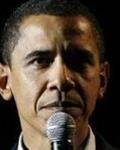

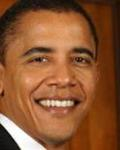

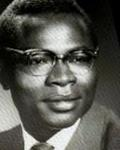

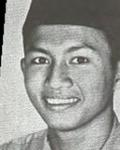

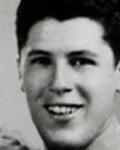

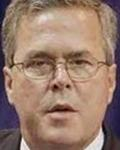

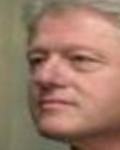

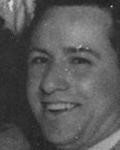

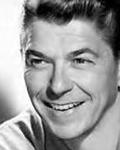

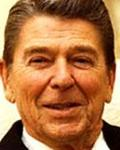

In [ ]:
for father in fathers:
  img1 = import_image(father[0])
  display(img1)


In [ ]:
path_to_csv = "/content/drive/MyDrive/Child Generator/CSVs/family_images_data.csv"
families = pd.read_csv(path_to_csv)
families.head()

,Family,Member,Image Path
0,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...
1,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00002...
2,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00003...
3,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00004...
4,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00005...


In [ ]:
# Dictionary to store results
results = {
    'person_image_counts': Counter(),
    'family_image_counts': Counter()
}

for idx, row in families.iterrows():
    img_path = row['Image Path']

    # Extract person and family information
    path_parts = img_path.split('/')
    family_name = path_parts[-3] if len(path_parts) >= 3 else "Unknown"
    person_name = path_parts[-2] if len(path_parts) >= 2 else "Unknown"

    # Count images per person and family
    results['person_image_counts'][person_name] += 1
    results['family_image_counts'][family_name] += 1



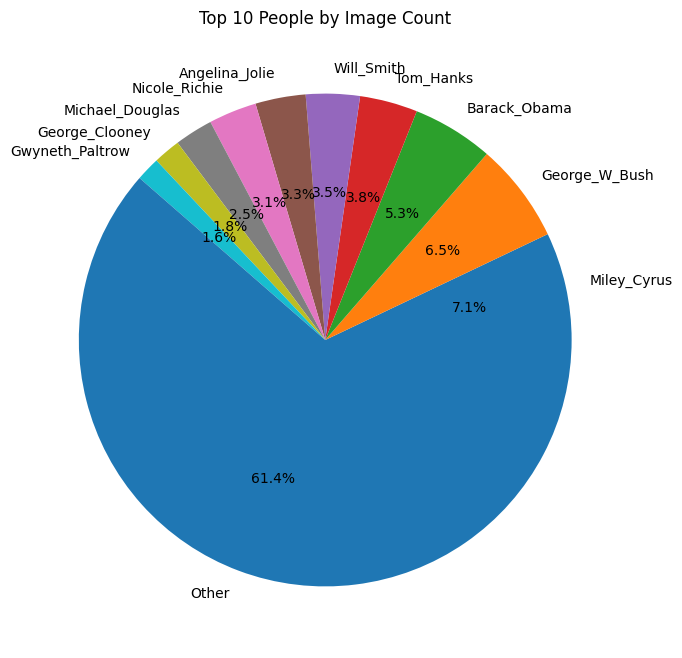

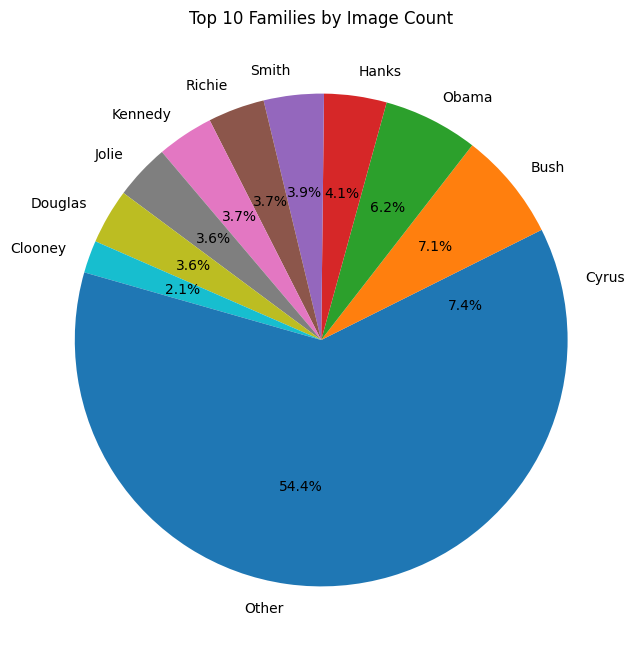

In [ ]:
# Create pie chart for top 10 people with most images
plt.figure(figsize=(12, 8))
top_people = dict(results['person_image_counts'].most_common(10))
other_count = sum(count for person, count in results['person_image_counts'].items() if person not in top_people)
if other_count > 0:
    top_people['Other'] = other_count

plt.pie(top_people.values(), labels=top_people.keys(), autopct='%1.1f%%')
plt.title('Top 10 People by Image Count')
plt.show()

# Create pie chart for top 10 families with most images
plt.figure(figsize=(12, 8))
top_families = dict(results['family_image_counts'].most_common(10))
other_count = sum(count for family, count in results['family_image_counts'].items() if family not in top_families)
if other_count > 0:
    top_families['Other'] = other_count


plt.pie(top_families.values(), labels=top_families.keys(), autopct='%1.1f%%')
plt.title('Top 10 Families by Image Count')
plt.show()

In [ ]:
print(results['person_image_counts'])
print(results['family_image_counts'])

Counter({'Miley_Cyrus': 1609, 'George_W_Bush': 1491, 'Barack_Obama': 1212, 'Tom_Hanks': 864, 'Will_Smith': 804, 'Angelina_Jolie': 751, 'Nicole_Richie': 717, 'Michael_Douglas': 572, 'George_Clooney': 406, 'Gwyneth_Paltrow': 358, 'Drew_Blyth_Barrymore': 353, 'Nicolas_Cage': 268, 'Liv_Tyler': 216, 'Ashley_Judd': 185, 'Rose_Elizabeth_Fitzgerald': 182, 'Dwight_D_Eisenhower': 175, 'Eddie_Fisher': 160, 'Dharmendra_Singh_Deol': 156, 'Ron_Howard': 156, 'Tiger_Woods': 145, 'Joseph_P_Kennedy_Sr': 133, 'Queen_Elizabeth_II': 128, 'Bing_Crosby': 125, 'Martin_Sheen': 108, 'Robert_Francis_Kennedy': 105, 'Kirk_Douglas': 104, 'Hema_malini': 102, 'Beau_Bridges': 100, 'Robert_Carradine': 99, 'Caroline_Princess_of_Hanover': 96, 'Priscilla_Presley': 93, 'Richard_Howard_Hilton': 92, 'Gerald_Rudolph_Ford': 90, 'Steven_Tyler': 90, 'Queen_Noor': 88, 'David_Rockefeller': 84, 'Catherine_Zeta-Jones': 82, 'Moon_Moon_Sen': 81, 'Mom_Rajawongse_Sirikit': 80, 'Sheikh_Mohammed_bin_Rashid_Al_Maktroum': 80, 'Lionel_Richie

In [ ]:
# Initialize MTCNN detector
detector = MTCNN()

# Create a copy of the families dataframe to add the keypoints
families_with_keypoints = families.copy()

# Add columns for keypoints
families_with_keypoints['keypoints'] = None
families_with_keypoints['face_detected'] = False

# Loop through all rows in the dataframe
for idx, row in families.iterrows():
    # Get the image path
    img_path = row['Image Path']

    # Load the image
    image = import_image(img_path)

    if image:
        # Convert PIL image to numpy array for MTCNN
        image_array = np.array(image)

        try:
            # Detect faces and keypoints
            faces = detector.detect_faces(image_array)

            if faces:
                # We found at least one face
                families_with_keypoints.loc[idx, 'face_detected'] = True

                # Use the first detected face (assuming there's only one face per image)
                keypoints = faces[0]['keypoints']

                # Store keypoints as a string
                keypoints_str = str(keypoints)
                families_with_keypoints.loc[idx, 'keypoints'] = keypoints_str

                if idx % 100 == 0:
                    print(f"Processed {idx} images, found keypoints for image: {img_path}")
            else:
                print(f"No face detected in image: {img_path}")
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    # Save intermediate results every 500 images
    if idx % 500 == 0 and idx > 0:
        families_with_keypoints.to_csv('families_with_keypoints_checkpoint.csv', index=False)
        print(f"Checkpoint saved at {idx} images processed")

# Save the final results
families_with_keypoints.to_csv('families_with_keypoints.csv', index=False)
print("Processing completed and results saved to 'families_with_keypoints.csv'")

# Display a summary of the results
detected_count = families_with_keypoints['face_detected'].sum()
total_count = len(families_with_keypoints)
print(f"Successfully detected faces in {detected_count} out of {total_count} images ({detected_count/total_count*100:.2f}%)")

Processed 0 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_00001.jpg
Processed 100 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20101.jpg
Processed 200 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20201.jpg
Processed 300 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20301.jpg
No face detected in image: Families/Obama/Barack_Obama/Barack_Obama_20364.jpg
Processed 400 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20401.jpg
Processed 500 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20097.jpg
Checkpoint saved at 500 images processed
Processed 600 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20197.jpg
Processed 700 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20297.jpg
No face detected in image: Families/Obama/Barack_Obama/Barack_Obama_20364.jpg
Proce

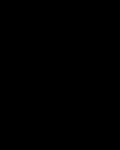

Families/Obama/Barack_Obama/Barack_Obama_20364.jpg


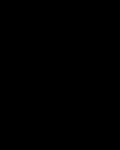

Families/Obama/Barack_Obama/Barack_Obama_20364.jpg


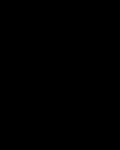

Families/Obama/Barack_Obama/Barack_Obama_20364.jpg


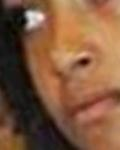

Families/Obama/Malia_Ann_Obama/Malia_Ann_Obama_00022.jpg


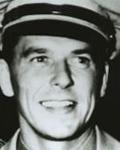

Families/Reagan/Ron_Reagan/Ron_Reagan_0006.jpg


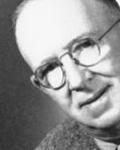

Families/Carter/James_Earl_Carter/James_Earl_Carter_0001.jpg


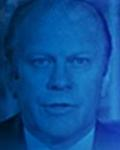

Families/FordPresident/Gerald_Rudolph_Ford/Gerald_Rudolph_Ford_0015.jpg


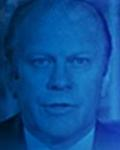

Families/FordPresident/Gerald_Rudolph_Ford/Gerald_Rudolph_Ford_0015.jpg


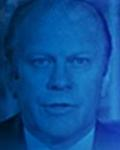

Families/FordPresident/Gerald_Rudolph_Ford/Gerald_Rudolph_Ford_0015.jpg


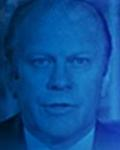

Families/FordPresident/Gerald_Rudolph_Ford/Gerald_Rudolph_Ford_0015.jpg


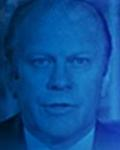

Families/FordPresident/Gerald_Rudolph_Ford/Gerald_Rudolph_Ford_0015.jpg


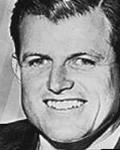

Families/Kennedy/Edward_Moore_Kennedy/Edward_Moore_Kennedy_0008.jpg


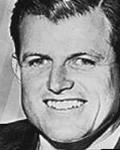

Families/Kennedy/Edward_Moore_Kennedy/Edward_Moore_Kennedy_0008.jpg


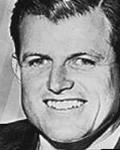

Families/Kennedy/Edward_Moore_Kennedy/Edward_Moore_Kennedy_0008.jpg


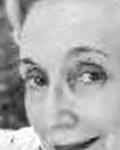

Families/Truman/Mary_Margaret_Truman/Mary_Margaret_Truman_0020.jpg


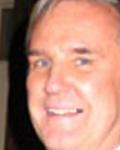

Families/Roosevelt/Franklin_Delano_Roosevelt_Jr/Franklin_Delano_Roosevelt_Jr_0002.jpg


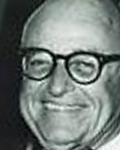

Families/Roosevelt/James_Roosevelt_Jr/James_Roosevelt_Jr_0004.jpg


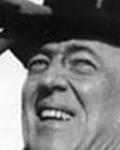

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0002.jpg


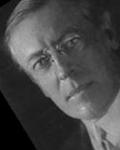

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0011.jpg


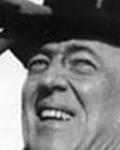

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0002.jpg


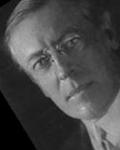

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0011.jpg


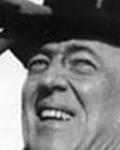

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0002.jpg


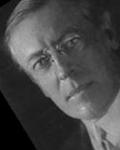

Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_0011.jpg


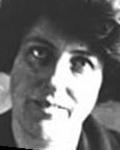

Families/Wilson/Ellen_Axson_Wilson/Ellen_Axson_Wilson_0001.jpg


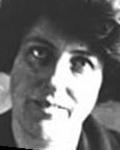

Families/Wilson/Ellen_Axson_Wilson/Ellen_Axson_Wilson_0001.jpg


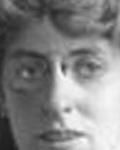

Families/Wilson/Margaret_Woodrow_Wilson/Margaret_Woodrow_Wilson_0003.jpg


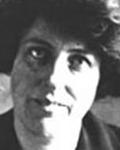

Families/Wilson/Margaret_Woodrow_Wilson/Margaret_Woodrow_Wilson_0006.jpg


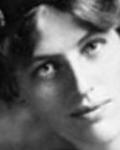

Families/Wilson/Jessie_Woodrow_Wilson/Jessie_Woodrow_Wilson_0002.jpg


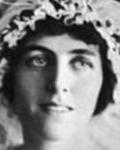

Families/Wilson/Eleanor_R_Wilson/Eleanor_R_Wilson_0001.jpg


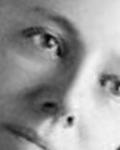

Families/Taft/Helen_Herron_Taft/Helen_Herron_Taft_0001.jpg


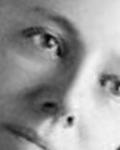

Families/Taft/Helen_Herron_Taft/Helen_Herron_Taft_0001.jpg


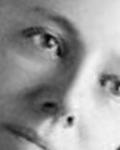

Families/Taft/Helen_Herron_Taft/Helen_Herron_Taft_0001.jpg


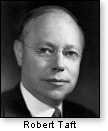

Families/Taft/Robert_Taft/Robert_Taft_0003.jpg


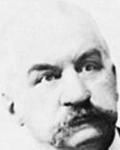

Families/Morgan/J_P_Morgan/J_P_Morgan_0001.jpg


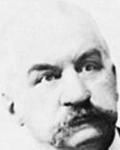

Families/Morgan/J_P_Morgan/J_P_Morgan_0001.jpg


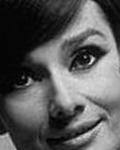

Families/Hepburn/Audrey_Hepburn/Audrey_Hepburn_0001.jpg


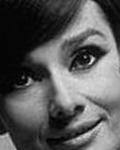

Families/Hepburn/Audrey_Hepburn/Audrey_Hepburn_0001.jpg


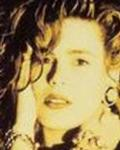

Families/Fisher/Tricia_Leigh_Fisher/Tricia_Leigh_Fisher_0012.jpg


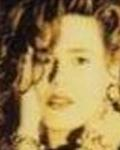

Families/Fisher/Tricia_Leigh_Fisher/Tricia_Leigh_Fisher_0036.jpg


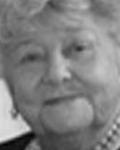

Families/Bridges/Dorothy_Bridges/Dorothy_Bridges_0003.jpg


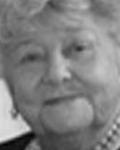

Families/Bridges/Dorothy_Bridges/Dorothy_Bridges_0003.jpg


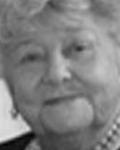

Families/Bridges/Dorothy_Bridges/Dorothy_Bridges_0003.jpg


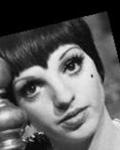

Families/Luft/Liza_Minnelli/Liza_Minnelli_0017.jpg


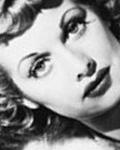

Families/Arnaz/Lucille_Ball/Lucille_Ball_0005.jpg


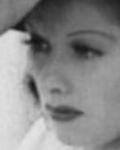

Families/Arnaz/Lucille_Ball/Lucille_Ball_0014.jpg


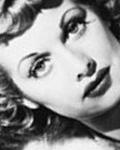

Families/Arnaz/Lucille_Ball/Lucille_Ball_0005.jpg


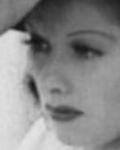

Families/Arnaz/Lucille_Ball/Lucille_Ball_0014.jpg


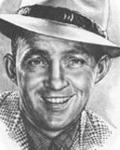

Families/Crosby/Bing_Crosby/Bing_Crosby_0008.jpg


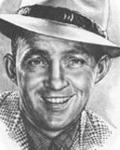

Families/Crosby/Bing_Crosby/Bing_Crosby_0008.jpg


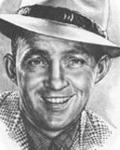

Families/Crosby/Bing_Crosby/Bing_Crosby_0008.jpg


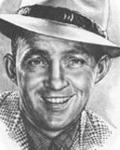

Families/Crosby/Bing_Crosby/Bing_Crosby_0008.jpg


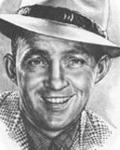

Families/Crosby/Bing_Crosby/Bing_Crosby_0008.jpg


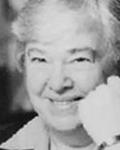

Families/Crosby/Dixie_Lee/Dixie_Lee_0015.jpg


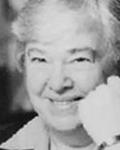

Families/Crosby/Dixie_Lee/Dixie_Lee_0015.jpg


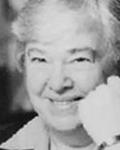

Families/Crosby/Dixie_Lee/Dixie_Lee_0015.jpg


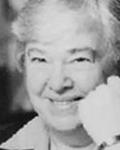

Families/Crosby/Dixie_Lee/Dixie_Lee_0015.jpg


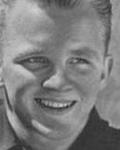

Families/Crosby/Gary_Crosby/Gary_Crosby_0005.jpg


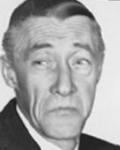

Families/Carradine/John_Carradine/John_Carradine_0004.jpg


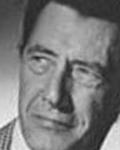

Families/Carradine/John_Carradine/John_Carradine_0009.jpg


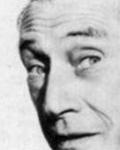

Families/Carradine/John_Carradine/John_Carradine_0010.jpg


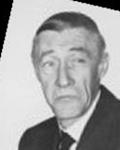

Families/Carradine/John_Carradine/John_Carradine_0013.jpg


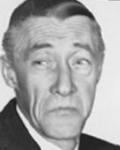

Families/Carradine/John_Carradine/John_Carradine_0004.jpg


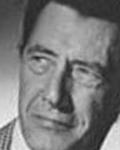

Families/Carradine/John_Carradine/John_Carradine_0009.jpg


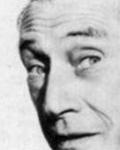

Families/Carradine/John_Carradine/John_Carradine_0010.jpg


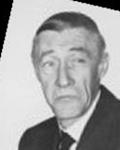

Families/Carradine/John_Carradine/John_Carradine_0013.jpg


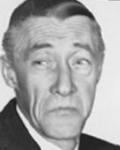

Families/Carradine/John_Carradine/John_Carradine_0004.jpg


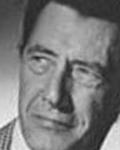

Families/Carradine/John_Carradine/John_Carradine_0009.jpg


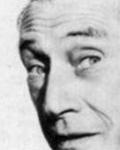

Families/Carradine/John_Carradine/John_Carradine_0010.jpg


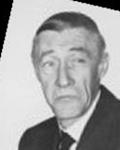

Families/Carradine/John_Carradine/John_Carradine_0013.jpg


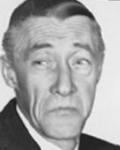

Families/Carradine/John_Carradine/John_Carradine_0004.jpg


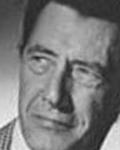

Families/Carradine/John_Carradine/John_Carradine_0009.jpg


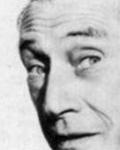

Families/Carradine/John_Carradine/John_Carradine_0010.jpg


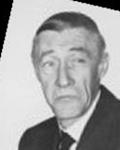

Families/Carradine/John_Carradine/John_Carradine_0013.jpg


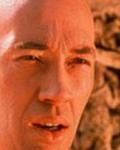

Families/Carradine/David_Carradine/David_Carradine_0001.jpg


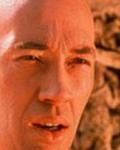

Families/Carradine/David_Carradine/David_Carradine_0001.jpg


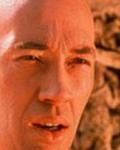

Families/Carradine/David_Carradine/David_Carradine_0001.jpg


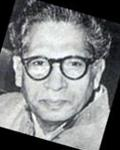

Families/Bachhan/Harivansh_Rai_Bachchan/Harivansh_Rai_Bachchan_0004.jpg


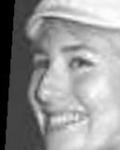

Families/Lenon/Cynthia_lenon/Cynthia_lenon_0004.jpg


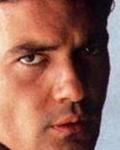

Families/Griffith/Antonio_Banderas/Antonio_Banderas_0006.jpg


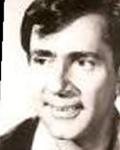

Families/Sahni/Balraj_Sahni/Balraj_Sahni_0003.jpg


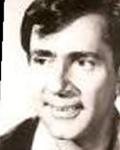

Families/Sahni/Balraj_Sahni/Balraj_Sahni_0003.jpg


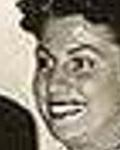

Families/Sinatra/Nancy_Barbato/Nancy_Barbato_0003.jpg


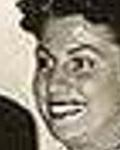

Families/Sinatra/Nancy_Barbato/Nancy_Barbato_0003.jpg


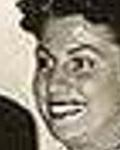

Families/Sinatra/Nancy_Barbato/Nancy_Barbato_0003.jpg


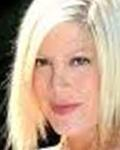

Families/Spelling/Tori_Spelling/Tori_Spelling_0014.jpg


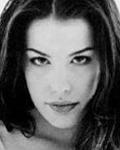

Families/Tyler/Liv_Tyler/Liv_Tyler_0030.jpg


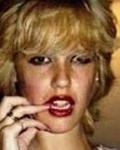

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0022.jpg


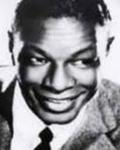

Families/Cole/Nat_King_Cole/Nat_King_Cole_0008.jpg


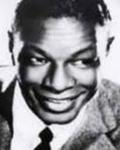

Families/Cole/Nat_King_Cole/Nat_King_Cole_0008.jpg


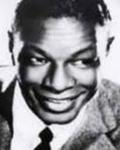

Families/Cole/Nat_King_Cole/Nat_King_Cole_0008.jpg


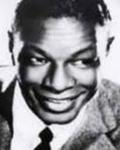

Families/Cole/Nat_King_Cole/Nat_King_Cole_0008.jpg


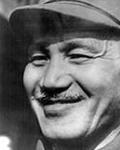

Families/Jiang/Chiang_Kai-shek/Chiang_Kai-shek_0005.jpg


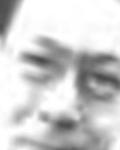

Families/Jiang/Jiang_Hsiao-yung/Jiang_Hsiao-yung_0001.jpg


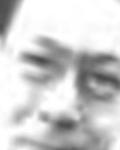

Families/Jiang/Jiang_Hsiao-yung/Jiang_Hsiao-yung_0001.jpg


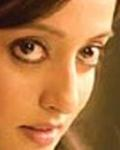

Families/Sen/Raima_Sen/Raima_Sen_0029.jpg


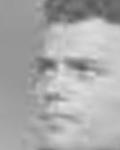

Families/Wayne/Patrick_Wayne/Patrick_Wayne_0001.jpg


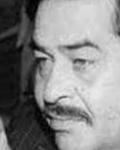

Families/Kapoor/Raj_Kapoor/Raj_Kapoor_0019.jpg


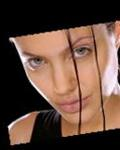

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0732.jpg


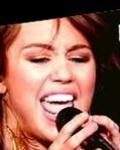

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0243.jpg


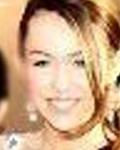

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0317.jpg


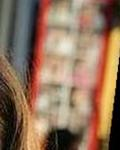

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1165.jpg


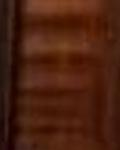

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1291.jpg


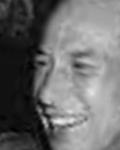

Families/Clooney/Jose_Ferrer/Jose_Ferrer_0016.jpg


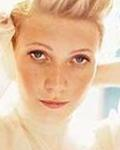

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0142.jpg


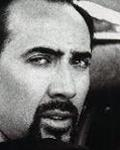

Families/Cage/Nicolas_Cage/Nicolas_Cage_0253.jpg


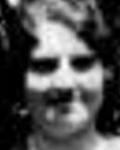

Families/Power/Helen_Emma_Reaume/Helen_Emma_Reaume_0001.jpg


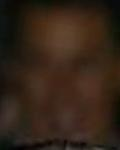

Families/Smith/Will_Smith/Will_Smith_0137.jpg


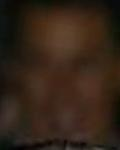

Families/Smith/Will_Smith/Will_Smith_0137.jpg


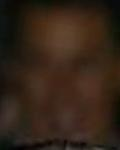

Families/Smith/Will_Smith/Will_Smith_0137.jpg


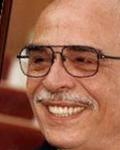

Families/Iman/King_Hussein/King_Hussein_0004.jpg


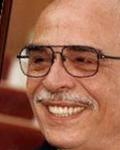

Families/Iman/King_Hussein/King_Hussein_0004.jpg


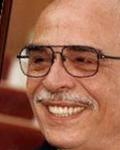

Families/Iman/King_Hussein/King_Hussein_0004.jpg


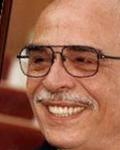

Families/Iman/King_Hussein/King_Hussein_0004.jpg


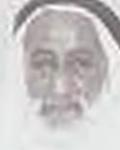

Families/Saudi/Sheikh_Rashid_bin_Saeed_Al_Maktoum/Sheikh_Rashid_bin_Saeed_Al_Maktoum_0001.jpg


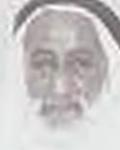

Families/Saudi/Sheikh_Rashid_bin_Saeed_Al_Maktoum/Sheikh_Rashid_bin_Saeed_Al_Maktoum_0001.jpg


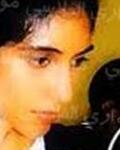

Families/Saudi/Sheikha_Maitha_bint_Mohammed_bin_Rashid_al_Maktoum/Sheikha_Maitha_bint_Mohammed_bin_Rashid_al_Maktoum_0016.jpg
Number of images not detected: 116


In [ ]:
not_detected_df = families_with_keypoints[families_with_keypoints['face_detected'] == False]
not_detected_images = not_detected_df['Image Path'].tolist()

for image_path in not_detected_images:
  img = import_image(image_path)
  display(img)
  print(image_path)

print(f"Number of images not detected: {len(not_detected_images)}")

I found that there's some duplicated image_paths, why is that the case. Is it an error with my families csv? or are there duplicated images in the families directory?

In [ ]:
# Group by 'Image Path' and get counts of each path
image_path_counts = families.groupby('Image Path').size().reset_index(name='counts')

# Filter for paths with counts greater than 1 (true duplicates)
duplicate_image_paths = image_path_counts[image_path_counts['counts'] > 1]['Image Path']

# Print the duplicated paths
print("Duplicated Image Paths:")
print(duplicate_image_paths)

Duplicated Image Paths:
0            Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0001.jpg
1            Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0002.jpg
2            Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0003.jpg
3            Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0004.jpg
4            Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0005.jpg
                               ...                        
13104    Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_...
13105    Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_...
13106    Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_...
13107    Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_...
13108    Families/Wilson/Woodrow_Wilson/Woodrow_Wilson_...
Name: Image Path, Length: 4761, dtype: object


In [ ]:
test_duplicate = families[families['Image Path'] == "Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0002.jpg"]
test_duplicate

,Family,Member,Image Path
7379,Arnaz,Desi_Arnaz,Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0002.jpg
7395,Arnaz,Desi_Arnaz,Families/Arnaz/Desi_Arnaz/Desi_Arnaz_0002.jpg


In [ ]:
# prompt: I want to remove duplicated Image Paths and save it to a different csv

# Create a new DataFrame without duplicates
families_no_duplicates = pd.read_csv('families_no_duplicates.csv')

families_no_duplicates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13327 entries, 0 to 13326
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Family      13327 non-null  object
 1   Member      13327 non-null  object
 2   Image Path  13327 non-null  object
dtypes: object(3)
memory usage: 312.5+ KB


In [ ]:
# Dictionary to store results
results = {
    'person_image_counts': Counter(),
    'family_image_counts': Counter()
}

for idx, row in families_no_duplicates.iterrows():
    img_path = row['Image Path']

    # Extract person and family information
    path_parts = img_path.split('/')
    family_name = path_parts[-3] if len(path_parts) >= 3 else "Unknown"
    person_name = path_parts[-2] if len(path_parts) >= 2 else "Unknown"

    # Count images per person and family
    results['person_image_counts'][person_name] += 1
    results['family_image_counts'][family_name] += 1



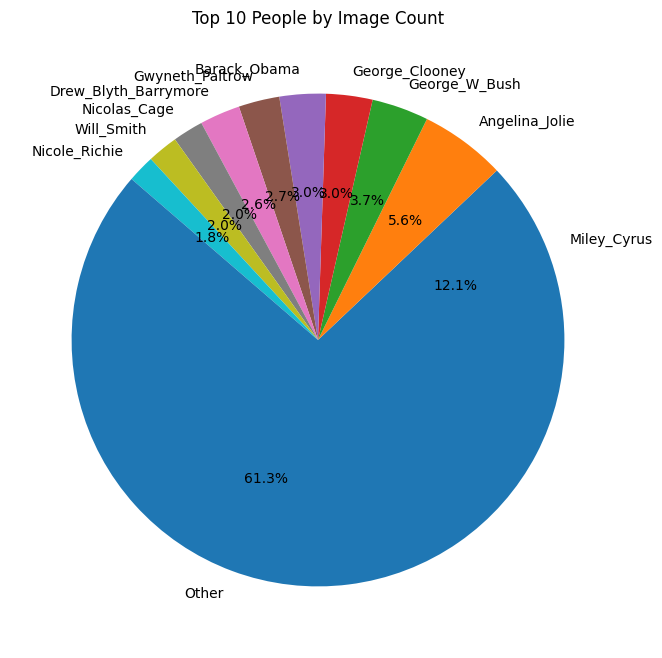

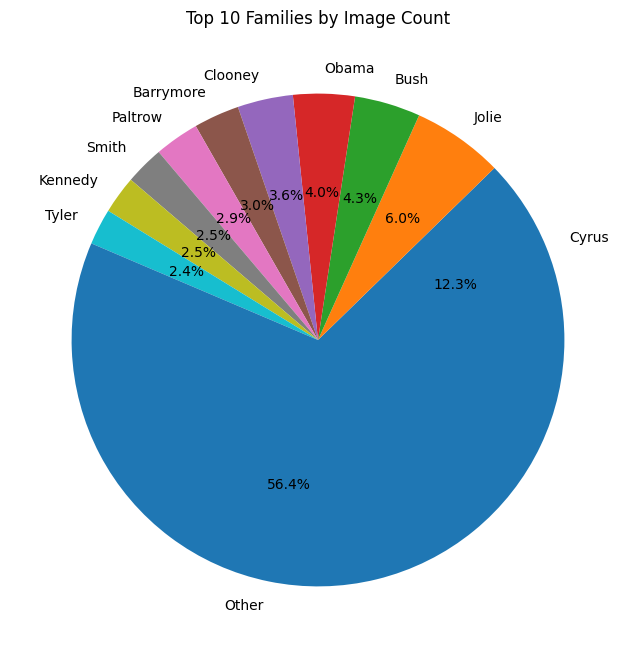

In [ ]:
# Create pie chart for top 10 people with most images
plt.figure(figsize=(12, 8))
top_people = dict(results['person_image_counts'].most_common(10))
other_count = sum(count for person, count in results['person_image_counts'].items() if person not in top_people)
if other_count > 0:
    top_people['Other'] = other_count

plt.pie(top_people.values(), labels=top_people.keys(), autopct='%1.1f%%')
plt.title('Top 10 People by Image Count')
plt.show()

# Create pie chart for top 10 families with most images
plt.figure(figsize=(12, 8))
top_families = dict(results['family_image_counts'].most_common(10))
other_count = sum(count for family, count in results['family_image_counts'].items() if family not in top_families)
if other_count > 0:
    top_families['Other'] = other_count


plt.pie(top_families.values(), labels=top_families.keys(), autopct='%1.1f%%')
plt.title('Top 10 Families by Image Count')
plt.show()

In [ ]:
print(results['person_image_counts'])
print(results['family_image_counts'])

Counter({'Miley_Cyrus': 1609, 'Angelina_Jolie': 751, 'George_W_Bush': 497, 'George_Clooney': 406, 'Barack_Obama': 404, 'Gwyneth_Paltrow': 358, 'Drew_Blyth_Barrymore': 353, 'Nicolas_Cage': 268, 'Will_Smith': 268, 'Nicole_Richie': 239, 'Liv_Tyler': 216, 'Tom_Hanks': 216, 'Ashley_Judd': 185, 'Tiger_Woods': 145, 'Michael_Douglas': 143, 'Joely_Fisher': 74, 'Ron_Howard': 52, 'Hema_malini': 51, 'Caroline_Kennedy': 48, 'Esha_Deol': 48, 'Tricia_Leigh_Fisher': 42, 'Catherine_Zeta-Jones': 41, 'Bobby_Deol': 41, 'Eddie_Fisher': 40, 'Dharmendra_Singh_Deol': 39, 'Rinke_Khanna': 38, 'Debbie_Reynolds': 37, 'Charlotte_Casiraghi': 37, 'Dwight_D_Eisenhower': 35, 'Cheryl_Howard': 35, 'Andrea_Casiraghi': 35, 'Jeb_Bush': 34, 'Dimple_Kapadia': 34, 'Judy_Garland': 33, 'Robert_Carradine': 33, 'twinkle_khanna': 33, 'Princess_Victoria': 33, 'Connie_Stevens': 32, 'Rajesh_Khanna': 32, 'Jerry_Lewis': 32, 'Lisa_Marie_Presley': 32, 'Raima_Sen': 32, 'Queen_Elizabeth_II': 32, 'Caroline_Princess_of_Hanover': 32, 'John_F_

In [ ]:
# Initialize MTCNN detector
detector = MTCNN()

# Create a copy of the families dataframe to add the keypoints
families_with_keypoints = families_no_duplicates.copy()
print(families_with_keypoints.info())

# Add columns for keypoints
families_with_keypoints['keypoints'] = None
families_with_keypoints['face_detected'] = False

# Loop through all rows in the dataframe
for idx, row in families.iterrows():
    # Get the image path
    img_path = row['Image Path']

    # Load the image
    image = import_image(img_path)

    if image:
        # Convert PIL image to numpy array for MTCNN
        image_array = np.array(image)

        try:
            # Detect faces and keypoints
            faces = detector.detect_faces(image_array)

            if faces:
                # We found at least one face
                families_with_keypoints.loc[idx, 'face_detected'] = True

                # Use the first detected face (assuming there's only one face per image)
                keypoints = faces[0]['keypoints']

                # Store keypoints as a string
                keypoints_str = str(keypoints)
                families_with_keypoints.loc[idx, 'keypoints'] = keypoints_str

                if idx % 100 == 0:
                    print(f"Processed {idx} images, found keypoints for image: {img_path}")
            else:
                print(f"No face detected in image: {img_path}")
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    # Save intermediate results every 500 images
    if idx % 500 == 0 and idx > 0:
        families_with_keypoints.to_csv('families_with_keypoints_checkpoint.csv', index=False)
        print(f"Checkpoint saved at {idx} images processed")

# Save the final results
families_with_keypoints.to_csv('families_with_keypoints.csv', index=False)
print("Processing completed and results saved to 'families_with_keypoints.csv'")

# Display a summary of the results
detected_count = families_with_keypoints['face_detected'].sum()
total_count = len(families_with_keypoints)
print(f"Successfully detected faces in {detected_count} out of {total_count} images ({detected_count/total_count*100:.2f}%)")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13327 entries, 0 to 13326
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Family      13327 non-null  object
 1   Member      13327 non-null  object
 2   Image Path  13327 non-null  object
dtypes: object(3)
memory usage: 312.5+ KB
None
Processed 0 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_00001.jpg
Processed 100 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20101.jpg
Processed 200 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20201.jpg
Processed 300 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20301.jpg
No face detected in image: Families/Obama/Barack_Obama/Barack_Obama_20364.jpg
Processed 400 images, found keypoints for image: Families/Obama/Barack_Obama/Barack_Obama_20401.jpg
Processed 500 images, found keypoints for image: Families/Obama/Barac

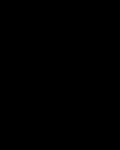

Families/Obama/Barack_Obama/Barack_Obama_20364.jpg


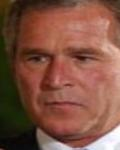

Families/Bush/George_W_Bush/George_W_Bush_0242.jpg


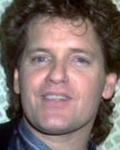

Families/Clinton/Roger_Clinton_Jr/Roger_Clinton_Jr_0010.jpg


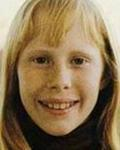

Families/Carter/Amy_Lynn_Carter/Amy_Lynn_Carter_0006.jpg


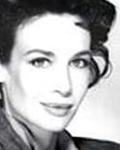

Families/Crosby/Mary_Crosby/Mary_Crosby_0014.jpg


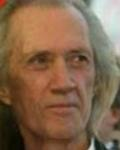

Families/Carradine/David_Carradine/David_Carradine_0017.jpg


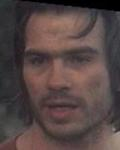

Families/Carradine/Robert_Carradine/Robert_Carradine_0017.jpg


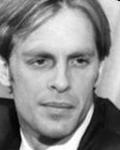

Families/Carradine/Keith_Carradine/Keith_Carradine_0002.jpg


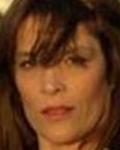

Families/Carradine/Calista_Carradine/Calista_Carradine_0005.jpg


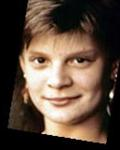

Families/Carradine/Martha_Plimpton/Martha_Plimpton_0003.jpg


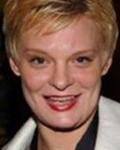

Families/Carradine/Martha_Plimpton/Martha_Plimpton_0021.jpg


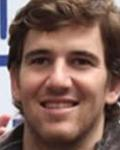

Families/Manning/Eli_Manning/Eli_Manning_0017.jpg


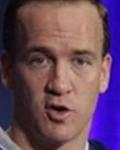

Families/Manning/Peyton_Manning/Peyton_Manning_0015.jpg


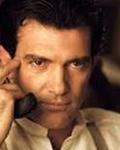

Families/Griffith/Antonio_Banderas/Antonio_Banderas_0015.jpg


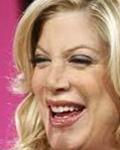

Families/Spelling/Tori_Spelling/Tori_Spelling_0007.jpg


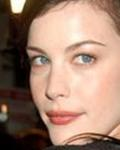

Families/Tyler/Liv_Tyler/Liv_Tyler_0073.jpg


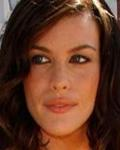

Families/Tyler/Liv_Tyler/Liv_Tyler_0084.jpg


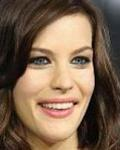

Families/Tyler/Liv_Tyler/Liv_Tyler_0172.jpg


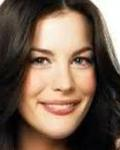

Families/Tyler/Liv_Tyler/Liv_Tyler_0181.jpg


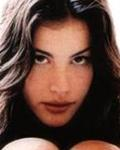

Families/Tyler/Liv_Tyler/Liv_Tyler_0186.jpg


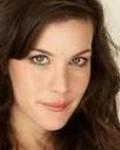

Families/Tyler/Liv_Tyler/Liv_Tyler_0195.jpg


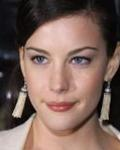

Families/Tyler/Liv_Tyler/Liv_Tyler_0200.jpg


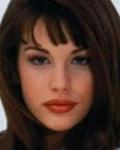

Families/Tyler/Liv_Tyler/Liv_Tyler_0209.jpg


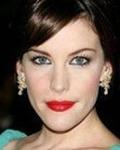

Families/Tyler/Liv_Tyler/Liv_Tyler_0213.jpg


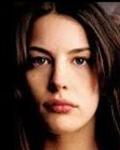

Families/Tyler/Liv_Tyler/Liv_Tyler_0216.jpg


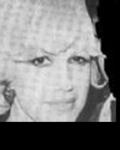

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0005.jpg


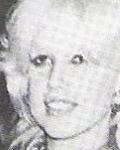

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0008.jpg


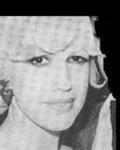

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0010.jpg


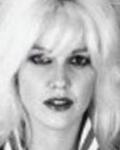

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0013.jpg


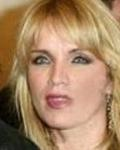

Families/Tyler/Teresa_Barrick/Teresa_Barrick_0010.jpg


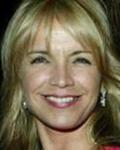

Families/Tyler/Teresa_Barrick/Teresa_Barrick_0012.jpg


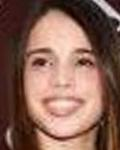

Families/Tyler/Chelsea_Anna_Tallarico/Chelsea_Anna_Tallarico_0002.jpg


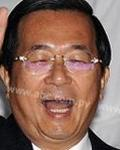

Families/Chen/Chen_Shui-bian/Chen_Shui-bian_0002.jpg


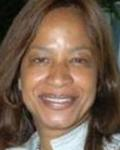

Families/Cole/Timolin_Cole/Timolin_Cole_0003.jpg


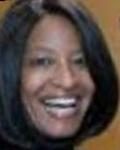

Families/Cole/Timolin_Cole/Timolin_Cole_0012.jpg


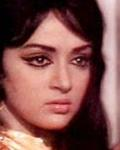

Families/Deol/Hema_malini/Hema_malini_0013.jpg


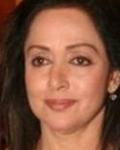

Families/Deol/Hema_malini/Hema_malini_0031.jpg


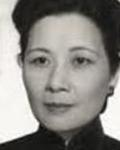

Families/Jiang/Soong_may-ling/Soong_may-ling_0012.jpg


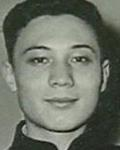

Families/Jiang/Jiang_Hsiao-wen/Jiang_Hsiao-wen_0003.jpg


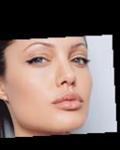

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0172.jpg


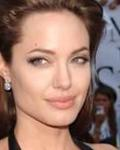

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0175.jpg


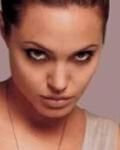

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0178.jpg


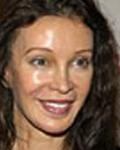

Families/Barrymore/Jaid_Barrymore/Jaid_Barrymore_0005.jpg


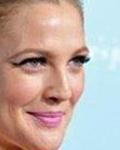

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0036.jpg


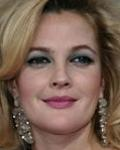

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0045.jpg


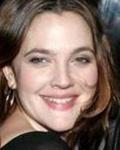

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0051.jpg


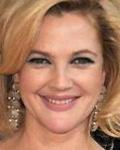

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0060.jpg


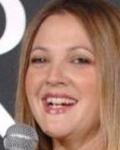

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0093.jpg


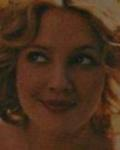

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0118.jpg


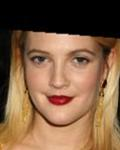

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0143.jpg


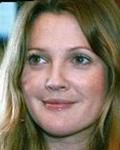

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0168.jpg


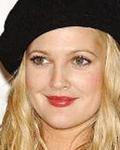

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0193.jpg


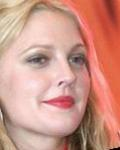

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0222.jpg


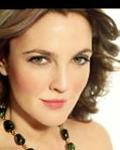

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0235.jpg


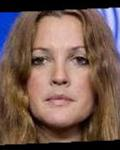

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0248.jpg


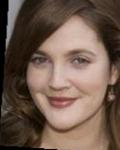

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0261.jpg


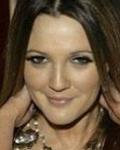

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0267.jpg


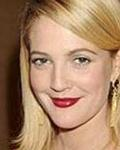

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0321.jpg


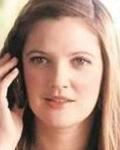

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0326.jpg


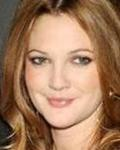

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0327.jpg


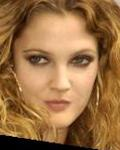

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0330.jpg


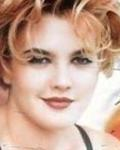

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0338.jpg


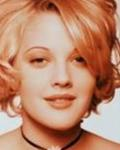

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0343.jpg


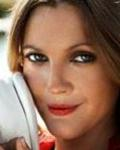

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0344.jpg


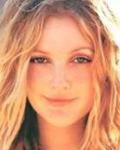

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0347.jpg


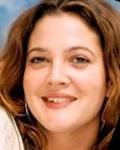

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0355.jpg


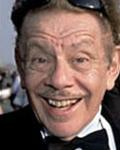

Families/Stiller/Jerry_Stiller/Jerry_Stiller_0004.jpg


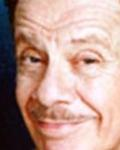

Families/Stiller/Jerry_Stiller/Jerry_Stiller_0005.jpg


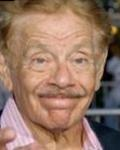

Families/Stiller/Jerry_Stiller/Jerry_Stiller_0008.jpg


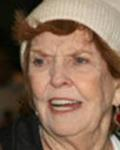

Families/Stiller/Anne_Meara/Anne_Meara_0001.jpg


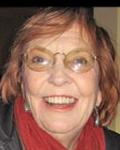

Families/Stiller/Anne_Meara/Anne_Meara_0006.jpg


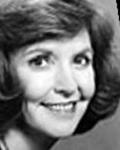

Families/Stiller/Anne_Meara/Anne_Meara_0007.jpg


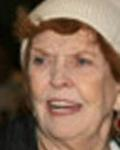

Families/Stiller/Anne_Meara/Anne_Meara_0010.jpg


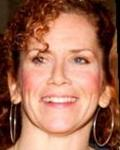

Families/Stiller/Amy_Stiller/Amy_Stiller_0004.jpg


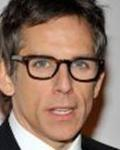

Families/Stiller/Bean_Stiller/Bean_Stiller_0015.jpg


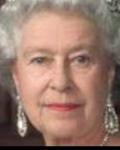

Families/British/Queen_Elizabeth_II/Queen_Elizabeth_II_00003.jpg


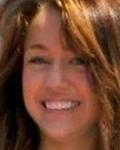

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0196.jpg


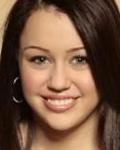

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1160.jpg


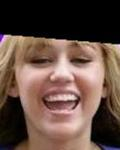

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1602.jpg


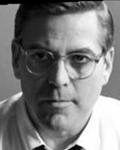

Families/Clooney/George_Clooney/George_Clooney_0238.jpg


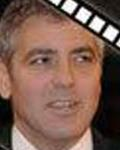

Families/Clooney/George_Clooney/George_Clooney_0248.jpg


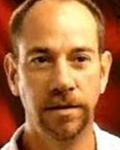

Families/Clooney/Miguel_Ferrer/Miguel_Ferrer_0013.jpg


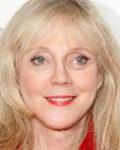

Families/Paltrow/Blythe_Danner/Blythe_Danner_0002.jpg


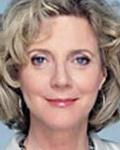

Families/Paltrow/Blythe_Danner/Blythe_Danner_0015.jpg


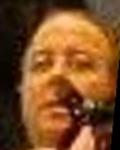

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0116.jpg


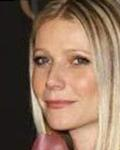

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0274.jpg


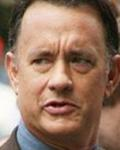

Families/Hanks/Tom_Hanks/Tom_Hanks_0124.jpg


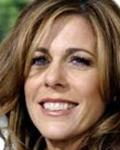

Families/Hanks/Rita_Wilson/Rita_Wilson_0016.jpg


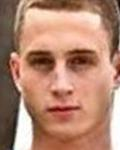

Families/Hanks/Chester_Hanks/Chester_Hanks_0006.jpg


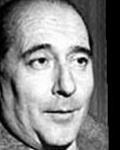

Families/Rossellini/Roberto_Rossellini/Roberto_Rossellini_0006.jpg


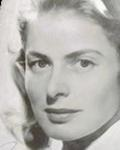

Families/Rossellini/Ingrid__Bergman/Ingrid__Bergman_0008.jpg


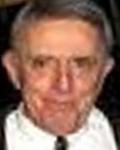

Families/Astin/John_Astin/John_Astin_0016.jpg


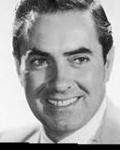

Families/Power/Tyrone_Power_Jr/Tyrone_Power_Jr_0012.jpg


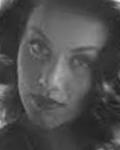

Families/Power/Linda_Christian/Linda_Christian_0001.jpg


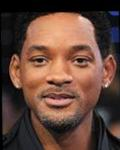

Families/Smith/Will_Smith/Will_Smith_0109.jpg


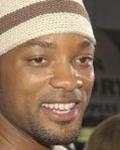

Families/Smith/Will_Smith/Will_Smith_0232.jpg


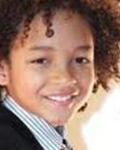

Families/Smith/Jaden_Smith/Jaden_Smith_0007.jpg
Number of images not detected: 97


In [ ]:
not_detected_df = families_with_keypoints[families_with_keypoints['face_detected'] == False]
not_detected_images = not_detected_df['Image Path'].tolist()

for image_path in not_detected_images:
  img = import_image(image_path)
  display(img)
  print(image_path)

print(f"Number of images not detected: {len(not_detected_images)}")

In [ ]:
# load up all the keypoints for everyone
path_to_csv = "/content/drive/MyDrive/Child Generator/CSVs/families_with_keypoints.csv"
families_with_keypoints = pd.read_csv(path_to_csv)

In [ ]:
# calculate the face angles

def calculate_face_angles(landmarks):
    if type(landmarks) == str:
        landmarks = ast.literal_eval(landmarks)

    # Convert to numpy arrays if they aren't already
    for key in landmarks:
        if not isinstance(landmarks[key], np.ndarray):
            landmarks[key] = np.array(landmarks[key])

    # Calculate centers
    eye_center = np.mean([landmarks['left_eye'], landmarks['right_eye']], axis=0)
    mouth_center = np.mean([landmarks['mouth_left'], landmarks['mouth_right']], axis=0)

    # Yaw calculation - based on horizontal asymmetry
    # When face turns right, left eye appears further from nose than right eye
    d_left = np.linalg.norm(landmarks['nose'] - landmarks['left_eye'])
    d_right = np.linalg.norm(landmarks['nose'] - landmarks['right_eye'])
    yaw_angle = math.degrees(math.atan2(d_right - d_left, d_right + d_left) * 5)  # Scaling factor of 5

    # Pitch calculation - based on nose position relative to eye-mouth line
    eye_mouth_vec = mouth_center - eye_center
    eye_mouth_len = np.linalg.norm(eye_mouth_vec)
    nose_proj = np.dot(landmarks['nose'] - eye_center, eye_mouth_vec) / eye_mouth_len
    nose_point_on_line = eye_center + (nose_proj / eye_mouth_len) * eye_mouth_vec
    nose_offset = np.linalg.norm(landmarks['nose'] - nose_point_on_line)
    nose_direction = 1 if landmarks['nose'][0] > nose_point_on_line[0] else -1
    pitch_angle = math.degrees(math.atan2(nose_offset, eye_mouth_len) * nose_direction * 2)  # Scaling factor

    # Roll calculation - angle between eye line and horizontal
    dx = landmarks['right_eye'][0] - landmarks['left_eye'][0]
    dy = landmarks['right_eye'][1] - landmarks['left_eye'][1]
    roll_angle = math.degrees(math.atan2(dy, dx))

    return {'yaw': yaw_angle, 'pitch': pitch_angle, 'roll': roll_angle}

In [ ]:
# test keypoint function
r1_keypoints = families_with_keypoints.loc[0, 'keypoints']
calculate_face_angles(r1_keypoints)


{'yaw': 1.4320961841646465,
 'pitch': 98.32565033042684,
 'roll': 91.45021629093343}

In [ ]:
filtered_df = families_with_keypoints[families_with_keypoints['face_detected'] == True]

# Drop the 'face_detected' column
filtered_df = filtered_df.drop(columns=['face_detected'])

# Save to CSV
filtered_df.to_csv('filtered_families_with_keypoints.csv', index=False)

In [ ]:
# load up all the keypoints for everyone
path_to_csv = "/content/drive/MyDrive/Child Generator/CSVs/filtered_families_with_keypoints.csv"
families_with_keypoints = pd.read_csv(path_to_csv)

,Family,Member,Image Path,keypoints
0,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,"{'nose': [58, 82], 'mouth_right': [79, 102], '..."
1,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00002...,"{'nose': [53, 86], 'mouth_right': [78, 114], '..."
2,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00003...,"{'nose': [57, 82], 'mouth_right': [80, 97], 'r..."
3,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00004...,"{'nose': [67, 85], 'mouth_right': [79, 99], 'r..."
4,Obama,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00005...,"{'nose': [53, 86], 'mouth_right': [84, 103], '..."
...,...,...,...,...
22644,NaN,NaN,NaN,"{'nose': [115, 118], 'mouth_right': [134, 129]..."
22645,NaN,NaN,NaN,"{'nose': [54, 65], 'mouth_right': [69, 70], 'r..."
22646,NaN,NaN,NaN,"{'nose': [155, 117], 'mouth_right': [173, 133]..."
22647,NaN,NaN,NaN,"{'nose': [121, 132], 'mouth_right': [146, 141]..."


In [ ]:
def process_keypoints_and_angles(df):
    """
    Processes keypoints and calculates face angles.

    Args:
        df: DataFrame containing 'family', 'member', 'Image Path', and 'keypoints' columns.

    Returns:
        A new DataFrame with added 'yaw', 'pitch', and 'roll' columns.
    """

    new_data = []
    for index, row in df.iterrows():
        keypoints_str = row['keypoints']
        try:
            # Convert keypoints string to dictionary
            keypoints_dict = ast.literal_eval(keypoints_str)

            # Calculate face angles
            angles = calculate_face_angles(keypoints_dict)

            # Append data to list
            new_data.append({
                'member': row['Member'],
                'image Path': row['Image Path'],
                'keypoints': keypoints_str,  # Keep original keypoints string
                'yaw': angles['yaw'],
                'pitch': angles['pitch'],
                'roll': angles['roll']
            })
        except (SyntaxError, ValueError):
            print(f"Error processing keypoints for row {index}: {keypoints_str}")

    # Create new DataFrame
    new_df = pd.DataFrame(new_data)
    return new_df

In [ ]:
processed_df = process_keypoints_and_angles(families_with_keypoints)


In [ ]:
processed_df.to_csv('families_with_angles.csv', index=False)


In [ ]:
processed_df.head(1)

,member,image Path,keypoints,yaw,pitch,roll
0,Barack_Obama,Families/Obama/Barack_Obama/Barack_Obama_00001...,"{'nose': [58, 82], 'mouth_right': [79, 102], '...",1.432096,98.32565,91.450216


In [ ]:
path_to_csv = "/content/drive/MyDrive/Child Generator/CSVs/families_with_angles.csv"
families_with_angles = pd.read_csv(path_to_csv)

In [ ]:
general_statistics = families_with_angles[['yaw', 'pitch', 'roll']].describe()
general_statistics

,yaw,pitch,roll
count,13230.000000,13230.000000,13230.000000
mean,-0.104676,90.501748,89.968471
std,3.059855,12.689834,3.812003
min,-42.089162,21.250506,52.326407
25%,-1.432096,82.874984,88.143398
50%,0.000000,90.000000,90.000000
75%,1.432096,98.275893,91.766954
max,35.311213,146.725112,120.815706


from matplotlib import pyplot as plt
general_statistics['yaw'].plot(kind='hist', bins=20, title='yaw')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
general_statistics['pitch'].plot(kind='hist', bins=20, title='pitch')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
general_statistics['roll'].plot(kind='hist', bins=20, title='roll')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
general_statistics.plot(kind='scatter', x='yaw', y='pitch', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
general_statistics.plot(kind='scatter', x='pitch', y='roll', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
general_statistics['yaw'].plot(kind='line', figsize=(8, 4), title='yaw')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
general_statistics['pitch'].plot(kind='line', figsize=(8, 4), title='pitch')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
general_statistics['roll'].plot(kind='line', figsize=(8, 4), title='roll')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def get_image_paths_by_angles(df, yaw=None, pitch=None, roll=None, higher_lower=None):
    """
    Returns a list of image paths based on angle criteria.

    Args:
        df: DataFrame containing 'member', 'Image Path', 'yaw', 'pitch', and 'roll' columns.
        yaw: Yaw angle value (or None to ignore).
        pitch: Pitch angle value (or None to ignore).
        roll: Roll angle value (or None to ignore).
        higher_lower: A dictionary specifying whether to filter for higher or lower values
                      for each angle (e.g., {'yaw': 'higher', 'pitch': 'lower'}).

    Returns:
        A list of image paths that match the specified criteria.
    """

    filtered_df = df.copy()  # Create a copy to avoid modifying the original DataFrame

    for angle, value in zip(['yaw', 'pitch', 'roll'], [yaw, pitch, roll]):
        if value is not None:
            if higher_lower and angle in higher_lower:
                if higher_lower[angle] == 'higher':
                    filtered_df = filtered_df[filtered_df[angle] > value]
                elif higher_lower[angle] == 'lower':
                    filtered_df = filtered_df[filtered_df[angle] < value]
            else:  # If higher_lower is not specified or angle is not in it
                filtered_df = filtered_df[filtered_df[angle] == value]

    return filtered_df['image Path'].tolist()

Families/Obama/Barack_Obama/Barack_Obama_20107.jpg


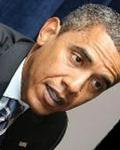

Families/Obama/Maya_Soetoro/Maya_Soetoro_00006.jpg


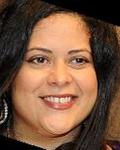

Families/Bush/George_W_Bush/George_W_Bush_0392.jpg


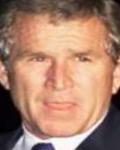

In [ ]:
image_paths = get_image_paths_by_angles(
    families_with_angles,
    yaw=30.0,
    higher_lower={'yaw': 'higher'}
)

for image_path in image_paths:
  print(image_path)
  display(import_image(image_path))



Families/Obama/Barack_Obama/Barack_Obama_20394.jpg


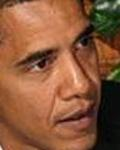

Families/Bush/George_W_Bush/George_W_Bush_0273.jpg


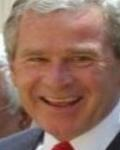

Families/Reagan/Jane_Wyman/Jane_Wyman_0007.jpg


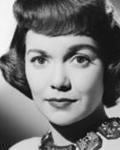

Families/Crosby/Bing_Crosby/Bing_Crosby_0013.jpg


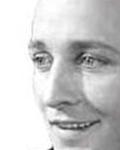

Families/Crosby/Bing_Crosby/Bing_Crosby_0014.jpg


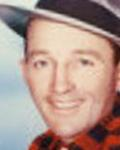

Families/Crosby/Mary_Crosby/Mary_Crosby_0010.jpg


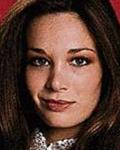

Families/LeeActor/Shannon_Lee/Shannon_Lee_0010.jpg


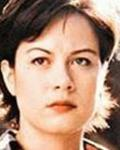

Families/Dutt/Sunil_Dutt/Sunil_Dutt_0015.jpg


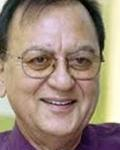

Families/Dutt/Sanjay_Dutt/Sanjay_Dutt_0009.jpg


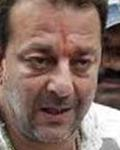

Families/Hilton/Kathleen_Elizabeth_Hilton/Kathleen_Elizabeth_Hilton_0017.jpg


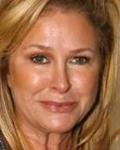

Families/Hilton/Barron_Nicholas_Hilton/Barron_Nicholas_Hilton_0004.jpg


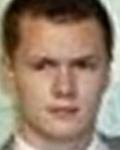

Families/Hilton/Barron_Nicholas_Hilton/Barron_Nicholas_Hilton_0016.jpg


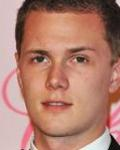

Families/Lewis/Jerry_Lewis/Jerry_Lewis_0008.jpg


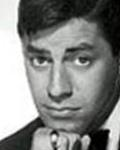

Families/Presley/Danielle_Riley_Keough/Danielle_Riley_Keough_0005.jpg


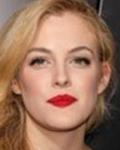

Families/Ritter/Dorothy_Fay/Dorothy_Fay_0010.jpg


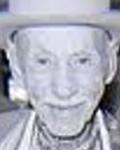

Families/Ritter/John_Ritter/John_Ritter_0001.jpg


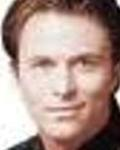

Families/Ritter/Nancy_Morgan/Nancy_Morgan_0008.jpg


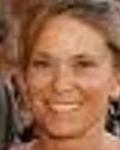

Families/Ritter/Nancy_Morgan/Nancy_Morgan_0012.jpg


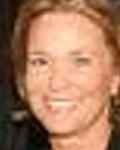

Families/Sahni/Balraj_Sahni/Balraj_Sahni_0003.jpg


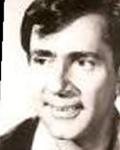

Families/Sahni/Balraj_Sahni/Balraj_Sahni_0007.jpg


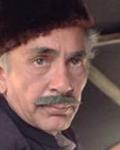

Families/Samarth/Nutan_Samarth/Nutan_Samarth_0015.jpg


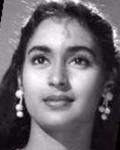

Families/Samarth/Tanuja_Samarth/Tanuja_Samarth_0003.jpg


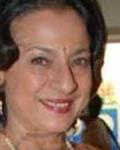

Families/Samarth/Kajol_Devgan/Kajol_Devgan_0010.jpg


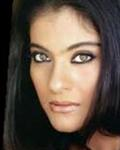

Families/Samarth/Kajol_Devgan/Kajol_Devgan_0014.jpg


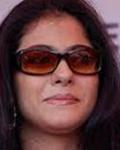

Families/Samarth/Tanisha_Mukherjee/Tanisha_Mukherjee_0014.jpg


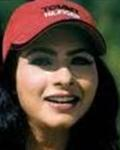

Families/Spelling/Tori_Spelling/Tori_Spelling_0008.jpg


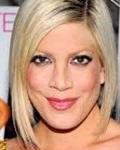

Families/Spelling/Tori_Spelling/Tori_Spelling_0009.jpg


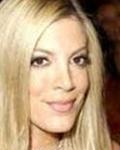

Families/Spelling/Randy_Spelling/Randy_Spelling_0010.jpg


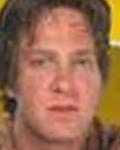

Families/Tyler/Steven_Tyler/Steven_Tyler_0005.jpg


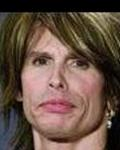

Families/Tyler/Steven_Tyler/Steven_Tyler_0018.jpg


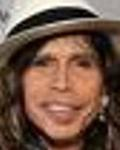

Families/Tyler/Bebe_Buell/Bebe_Buell_0001.jpg


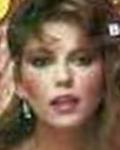

Families/Tyler/Bebe_Buell/Bebe_Buell_0014.jpg


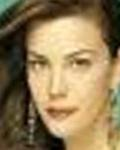

Families/Tyler/Liv_Tyler/Liv_Tyler_0096.jpg


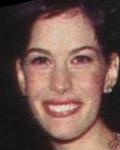

Families/Tyler/Liv_Tyler/Liv_Tyler_0113.jpg


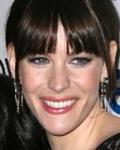

Families/Tyler/Liv_Tyler/Liv_Tyler_0140.jpg


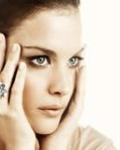

Families/Tyler/Liv_Tyler/Liv_Tyler_0146.jpg


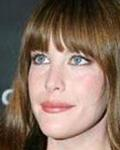

Families/Tyler/Liv_Tyler/Liv_Tyler_0155.jpg


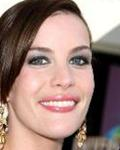

Families/Tyler/Liv_Tyler/Liv_Tyler_0161.jpg


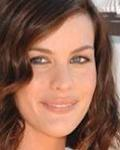

Families/Tyler/Liv_Tyler/Liv_Tyler_0169.jpg


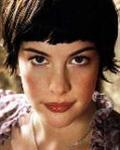

Families/Tyler/Liv_Tyler/Liv_Tyler_0179.jpg


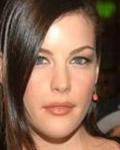

Families/Tyler/Liv_Tyler/Liv_Tyler_0193.jpg


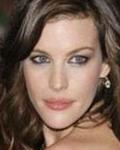

Families/Tyler/Liv_Tyler/Liv_Tyler_0207.jpg


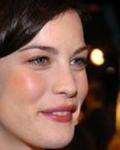

Families/Tyler/Cyrinda_Foxe/Cyrinda_Foxe_0011.jpg


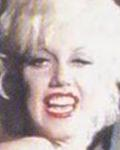

Families/Tyler/Mia_Tyler/Mia_Tyler_0001.jpg


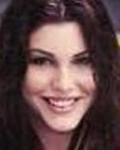

Families/Tyler/Mia_Tyler/Mia_Tyler_0012.jpg


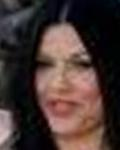

Families/Tyler/Teresa_Barrick/Teresa_Barrick_0009.jpg


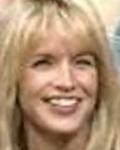

Families/Chen/Chen_Shui-bian/Chen_Shui-bian_0003.jpg


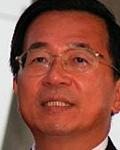

Families/Cole/Timolin_Cole/Timolin_Cole_0022.jpg


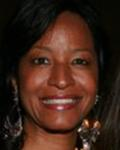

Families/Cole/Timolin_Cole/Timolin_Cole_0027.jpg


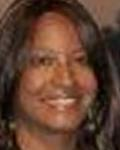

Families/Deol/Dharmendra_Singh_Deol/Dharmendra_Singh_Deol_0001.jpg


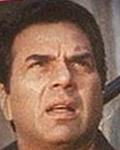

Families/Deol/Dharmendra_Singh_Deol/Dharmendra_Singh_Deol_0022.jpg


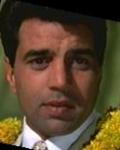

Families/Deol/Dharmendra_Singh_Deol/Dharmendra_Singh_Deol_0025.jpg


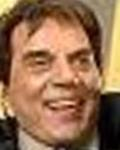

Families/Deol/Bobby_Deol/Bobby_Deol_0006.jpg


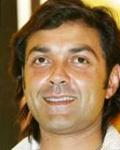

Families/Deol/Bobby_Deol/Bobby_Deol_0011.jpg


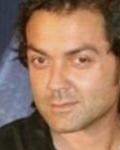

Families/Guthrie/Cathy_Guthrie/Cathy_Guthrie_0007.jpg


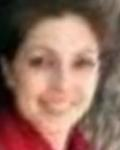

Families/Howard/Clint_Howard/Clint_Howard_0005.jpg


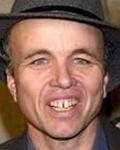

Families/Howard/Ron_Howard/Ron_Howard_0014.jpg


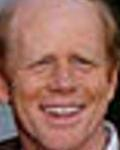

Families/Howard/Ron_Howard/Ron_Howard_0031.jpg


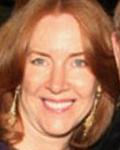

Families/Howard/Cheryl_Howard/Cheryl_Howard_0011.jpg


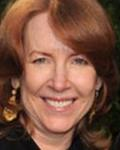

Families/Howard/Bryce_Dallas_Howard/Bryce_Dallas_Howard_0012.jpg


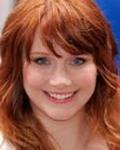

Families/Brolin/Josh_Brolin/Josh_Brolin_0007.jpg


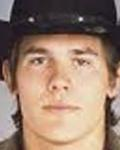

Families/Jiang/Jiang_You-bou/Jiang_You-bou_0008.jpg


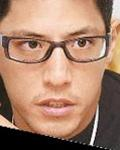

Families/Sen/Moon_Moon_Sen/Moon_Moon_Sen_0008.jpg


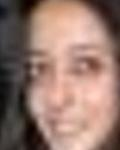

Families/Sen/Raima_Sen/Raima_Sen_0007.jpg


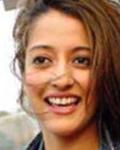

Families/Sen/Riya_Sen/Riya_Sen_0001.jpg


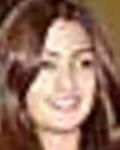

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0399.jpg


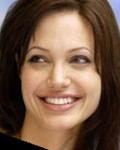

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0411.jpg


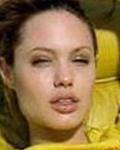

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0416.jpg


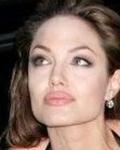

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0428.jpg


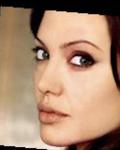

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0472.jpg


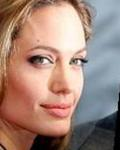

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0691.jpg


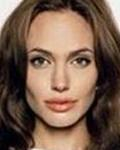

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0699.jpg


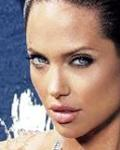

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0706.jpg


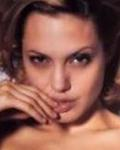

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0709.jpg


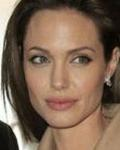

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0724.jpg


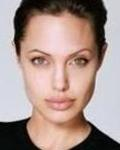

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0732.jpg


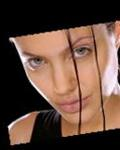

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0739.jpg


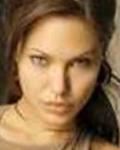

Families/Jolie/Angelina_Jolie/Angelina_Jolie_0742.jpg


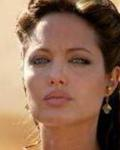

Families/Barrymore/Diana_Barrymore/Diana_Barrymore_0001.jpg


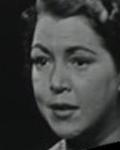

Families/Barrymore/John_Blyth_Barrymore/John_Blyth_Barrymore_0002.jpg


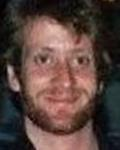

Families/Barrymore/Jaid_Barrymore/Jaid_Barrymore_0008.jpg


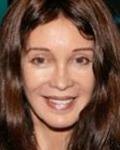

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0017.jpg


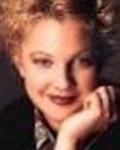

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0078.jpg


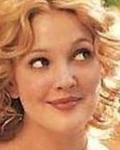

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0319.jpg


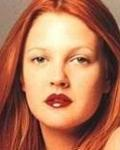

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0336.jpg


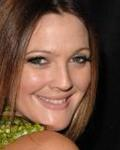

Families/Barrymore/Drew_Blyth_Barrymore/Drew_Blyth_Barrymore_0353.jpg


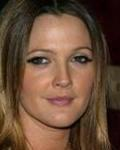

Families/Stiller/Jerry_Stiller/Jerry_Stiller_0014.jpg


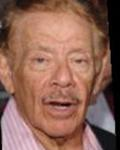

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0141.jpg


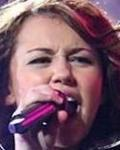

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0158.jpg


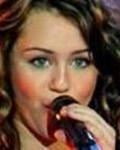

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0506.jpg


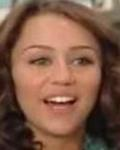

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0529.jpg


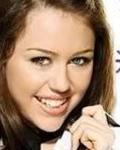

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0552.jpg


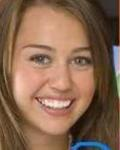

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0575.jpg


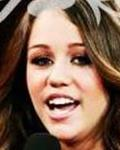

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0969.jpg


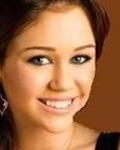

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1193.jpg


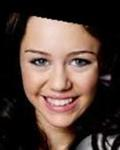

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1200.jpg


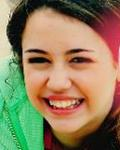

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1204.jpg


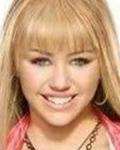

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1223.jpg


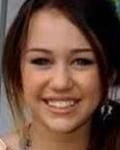

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1237.jpg


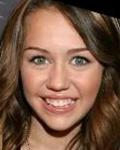

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1253.jpg


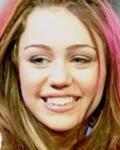

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1269.jpg


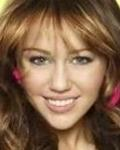

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1497.jpg


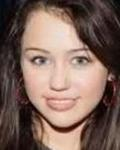

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1518.jpg


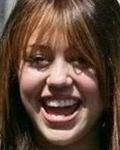

Families/Cyrus/Miley_Cyrus/Miley_Cyrus_1539.jpg


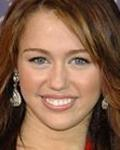

Families/Clooney/George_Clooney/George_Clooney_0134.jpg


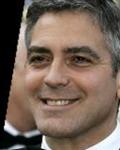

Families/Clooney/George_Clooney/George_Clooney_0147.jpg


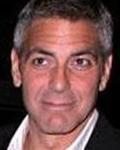

Families/Clooney/George_Clooney/George_Clooney_0352.jpg


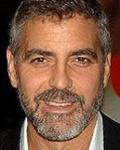

Families/Clooney/Jose_Ferrer/Jose_Ferrer_0010.jpg


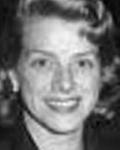

Families/Clooney/Rosemary_Clooney/Rosemary_Clooney_0002.jpg


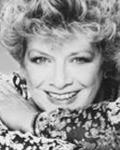

Families/Clooney/Miguel_Ferrer/Miguel_Ferrer_0001.jpg


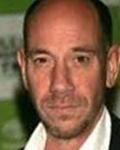

Families/Clooney/Miguel_Ferrer/Miguel_Ferrer_0012.jpg


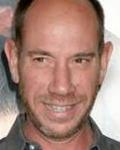

Families/Paltrow/Blythe_Danner/Blythe_Danner_0001.jpg


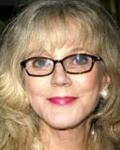

Families/Paltrow/Blythe_Danner/Blythe_Danner_0014.jpg


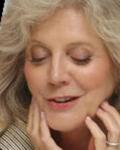

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0035.jpg


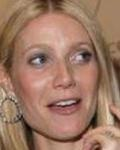

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0149.jpg


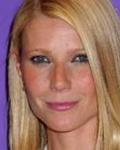

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0179.jpg


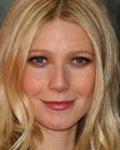

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0209.jpg


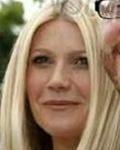

Families/Paltrow/Gwyneth_Paltrow/Gwyneth_Paltrow_0285.jpg


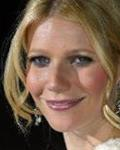

Families/Judd/Ashley_Judd/Ashley_Judd_0177.jpg


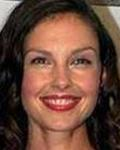

Families/Cage/Nicolas_Cage/Nicolas_Cage_0101.jpg


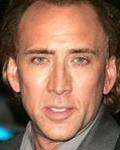

Families/Cage/Nicolas_Cage/Nicolas_Cage_0134.jpg


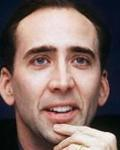

Families/Cage/Nicolas_Cage/Nicolas_Cage_0149.jpg


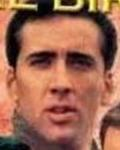

Families/Cage/Nicolas_Cage/Nicolas_Cage_0213.jpg


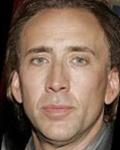

Families/Cage/Nicolas_Cage/Nicolas_Cage_0217.jpg


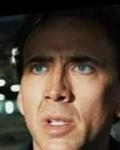

Families/Cage/Nicolas_Cage/Nicolas_Cage_0225.jpg


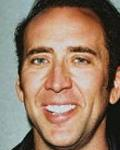

Families/Cage/Nicolas_Cage/Nicolas_Cage_0229.jpg


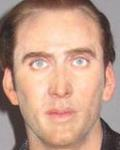

Families/Osbourne/Aimee_Osbourne/Aimee_Osbourne_0005.jpg


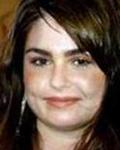

Families/Osbourne/Aimee_Osbourne/Aimee_Osbourne_0007.jpg


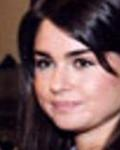

Families/Osbourne/Aimee_Osbourne/Aimee_Osbourne_0009.jpg


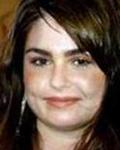

Families/Osbourne/Jack_Osbourne/Jack_Osbourne_0009.jpg


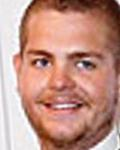

Families/Astin/John_Astin/John_Astin_0015.jpg


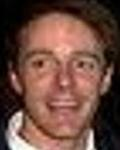

Families/Power/Tyrone_Power_Jr/Tyrone_Power_Jr_0015.jpg


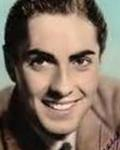

Families/Power/Linda_Christian/Linda_Christian_0004.jpg


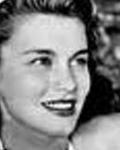

Families/Power/Romina_Francesca_Power/Romina_Francesca_Power_0012.jpg


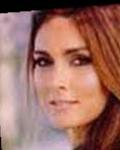

Families/Smith/Will_Smith/Will_Smith_0103.jpg


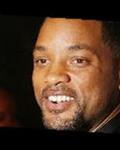

Families/Smith/Will_Smith/Will_Smith_0146.jpg


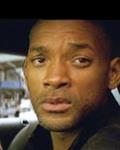

Families/Smith/Will_Smith/Will_Smith_0159.jpg


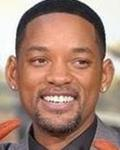

Families/Smith/Will_Smith/Will_Smith_0178.jpg


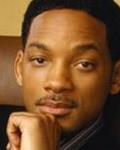

Families/Smith/Will_Smith/Will_Smith_0194.jpg


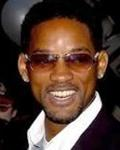

Families/Smith/Will_Smith/Will_Smith_0210.jpg


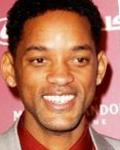

In [ ]:
image_paths = get_image_paths_by_angles(
    families_with_angles,
    yaw=-10.0,
    higher_lower={'yaw': 'lower'}
)

for image_path in image_paths:
  print(image_path)
  display(import_image(image_path))



In [ ]:
# Find rows where 'Image Path' is NaN
nan_image_paths = families_with_angles[families_with_angles['image Path'].isna()]

# Print the rows
nan_image_paths


,member,image Path,keypoints,yaw,pitch,roll


#. Download pre-trained SFD face detector model...


ConnectionError: Error: https://www.dropbox.com/s/zejv9acgk62lfbv/sfd.tar?dl=1

In [ ]:
# prompt: for image_path in families_with_angles, I want to collect and download all of them into a big folder, how can I do this?

import os
from PIL import Image
import requests
from io import BytesIO

def download_images(image_paths, download_dir):
    """
    Downloads images from a list of paths and saves them to a specified directory.

    Args:
        image_paths: A list of image paths.
        download_dir: The directory to save the downloaded images.
    """

    if not os.path.exists(download_dir):
        os.makedirs(download_dir)

    for image_path in image_paths:
        try:
            # Attempt to open the image using PIL
            actual_path = "/content/drive/MyDrive/Child Generator/"
            image_path = os.path.join(actual_path, image_path)
            img = Image.open(image_path)

            # Construct the filename (assuming image_path is a relative path)
            # Families/Richie/Nicole_Richie/Nicole_Richie_0154.jpg
            filename = os.path.basename(image_path)
            save_path = os.path.join(download_dir, filename)

            # Save the image
            img.save(save_path)
            print(f"Downloaded and saved: {image_path} to {save_path}")

        except (FileNotFoundError, OSError, IOError) as e:
            print(f"Error processing image {image_path}: {e}")

        except Exception as e:
            print(f"Unexpected error for {image_path}: {e}")


# Example usage:  (Replace with your actual image paths and download directory)
download_dir = "/content/downloaded_images"  # Create this directory if it doesn't exist
download_images(families_with_angles['image Path'].tolist(), download_dir)


Streaming output truncated to the last 5000 lines.
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0288.jpg to /content/downloaded_images/Miley_Cyrus_0288.jpg
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0289.jpg to /content/downloaded_images/Miley_Cyrus_0289.jpg
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0290.jpg to /content/downloaded_images/Miley_Cyrus_0290.jpg
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0291.jpg to /content/downloaded_images/Miley_Cyrus_0291.jpg
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0292.jpg to /content/downloaded_images/Miley_Cyrus_0292.jpg
Downloaded and saved: /content/drive/MyDrive/Child Generator/Families/Cyrus/Miley_Cyrus/Miley_Cyrus_0293.jpg to /content/downloaded_images/Miley_Cyru

In [ ]:
# prompt: I have a folder called downloaded_images at this path, /content/downloaded_images, I would like to copy it to this path: /content/drive/MyDrive/Child Generator/HelperFiles, how can I do this?

import shutil

source_path = "/content/downloaded_images"
destination_path = "/content/drive/MyDrive/Child Generator/HelperFiles"

# Use shutil.copytree to copy the entire directory
try:
    shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
    print(f"Successfully copied '{source_path}' to '{destination_path}'")
except Exception as e:
    print(f"Error copying directory: {e}")


Successfully copied '/content/downloaded_images' to '/content/drive/MyDrive/Child Generator/HelperFiles'
